In [1]:
import sys
formerPath = sys.path
sys.path.append('./code/')
sys.path.append('./BS/')

In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import sklearn as skl


import bootstrapping
import dataSetConstruction
import backtest
import BS
import loadData
import plotTools
import SSVI


from Bisect import bisect
from newton import newton
from BSImplVol import bsimpvol

import importlib

# Load modules and external files

You need to import four python scripts for implied volatility calibration :
- *newton.py*
- *BSImplVol.py*
- *BS.py*
- *Bisect.py*

In [3]:
%load_ext autoreload
%autoreload 2


In [4]:
#Load python files to google colaborative environment
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

ModuleNotFoundError: No module named 'google.colab'

In [67]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

# Load data with google colab 

#### From excel file :

You will find in github repository six days of data.
For each day you need to load six csv files :
- *underlying.csv* for the stock value.
- *locvol.csv* for the local volatility calibrated with tree pricing and tikhonov volatility (see Crépey (2002)).
- *dividend.csv* for dividend extracted from put-call parity.
- *discount.csv* for zero-coupon curve. 
- *dataTrain.csv* for prices and/or implied volatility used in training set.
- *dataTest.csv* for prices and/or implied volatility used in testing set.

In [3]:
#Load csv files to get data
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  

ModuleNotFoundError: No module named 'google.colab'

In [3]:
workingFolder = "./data/09082001/"

Bootstrap discounting


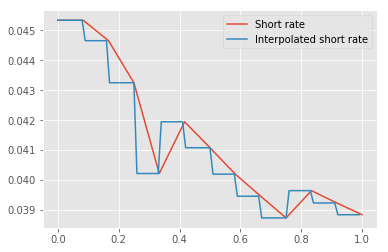

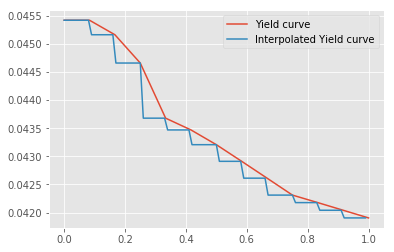

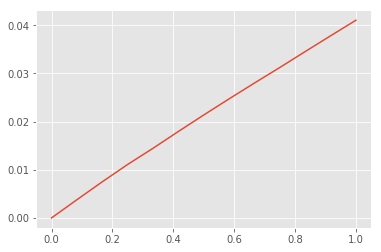

Bootstrap dividend


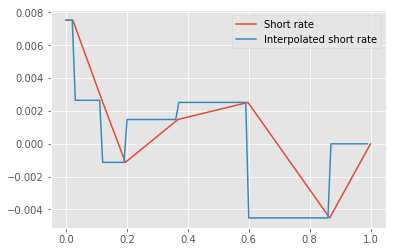

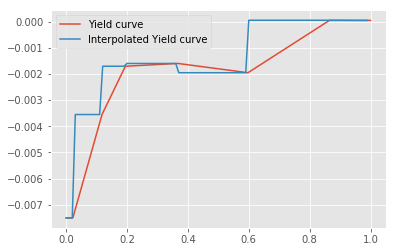

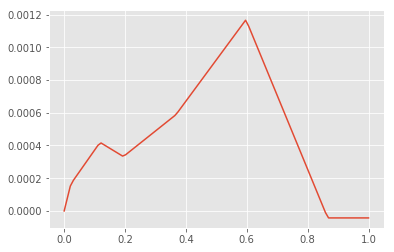

In [189]:
#Read csv files as dataFrames
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromCSV(workingFolder,
                                                                  "9_8_2001__filterdax")

#### From Dat files

Tikhonov PDE repricing error on training set :  2.4207935408017573
Bootstrap discounting


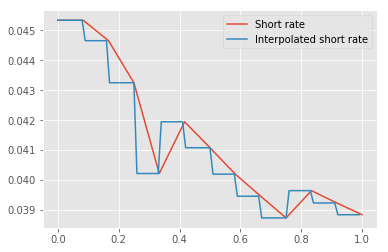

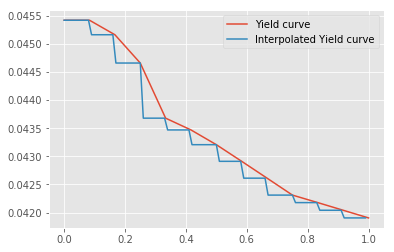

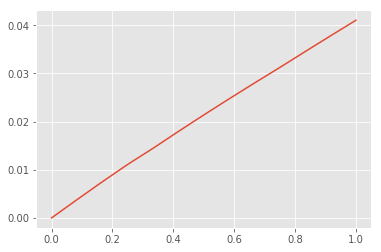

Bootstrap dividend


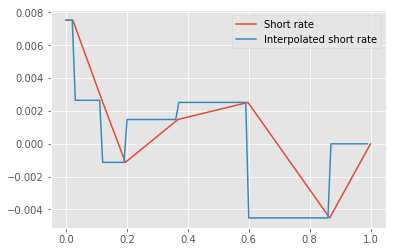

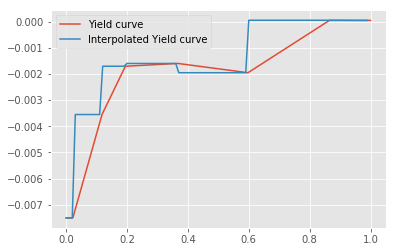

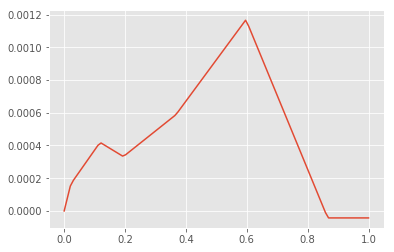

In [18]:
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromDat(workingFolder,
                                                                  "9_8_2001__filterdax")

In [88]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [5]:
pd.options.mode.chained_assignment = 'raise'

#### SPX Data

We assume a piecewise constant discount short rate $r$ and a piecewise constant dividend short rate $q$.

We estimate the "zero coupon dividend" $D(T) = e^{-\int_{0}^{T} q_s ds}$ by regressing it against maturity :
$$e^{-\int_{0}^{T} q_s ds} = \frac{C(T,K) - P(T,K) + K e^{-\int_{0}^{T} r_s ds}}{S_0}$$


Then we have $\hat{q}_t = - \frac{ \log{D(\overline{T})} - \log{D(\underline{T})} }{ \overline{T} - \underline{T} }$ with $\overline{T}$ the smallest discretized maturity greater than $T$ and $\underline{T}$ the grestest discretized maturity inferior than $T$.

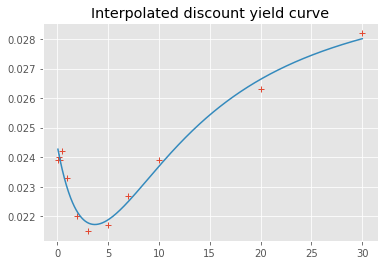

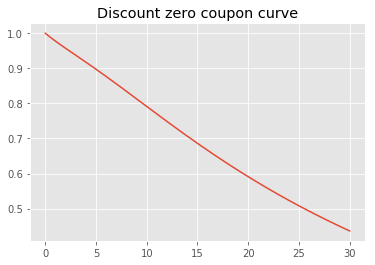

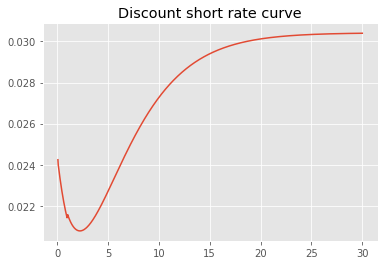

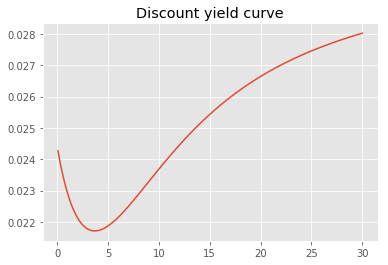

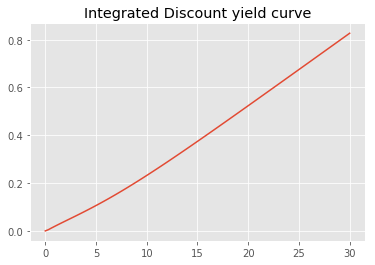

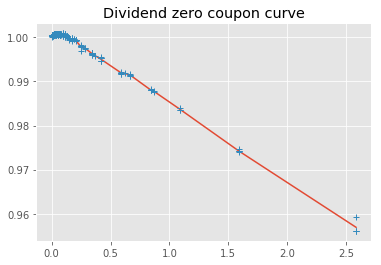

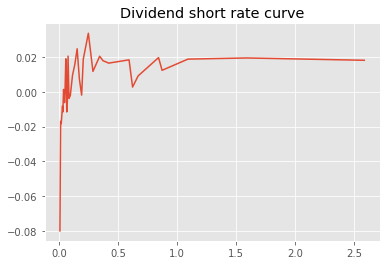

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


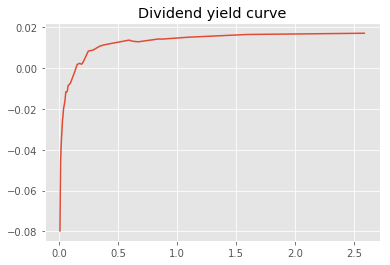

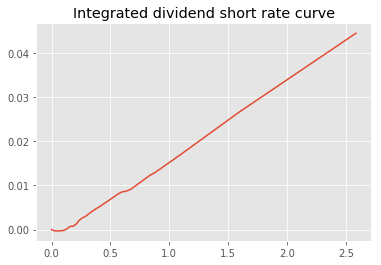

In [3]:
workingFolder = "./data/"
fileName = "Option_SPX_18_Mai_2019Feuille2.xlsm"
asOfDate = "2019-05-18"
trainingSet, testingSet, bootstrap, S0 = loadData.loadCBOTData(workingFolder, fileName, asOfDate)

In [8]:
importlib.reload(bootstrapping)

<module 'dataSetConstruction' from './code/dataSetConstruction.py'>

#### Load preformatted data

In [5]:
workingFolder = "./data/"
trainingSet, testingSet, bootstrap, S0 = loadData.loadFormattedData(workingFolder)

####  Eurostoxx data

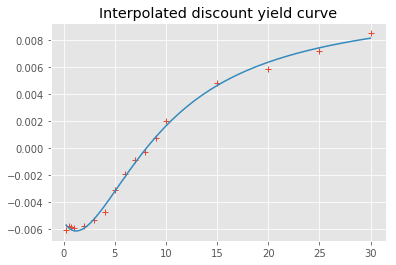

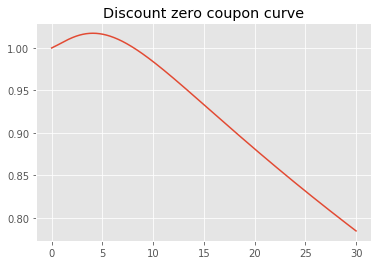

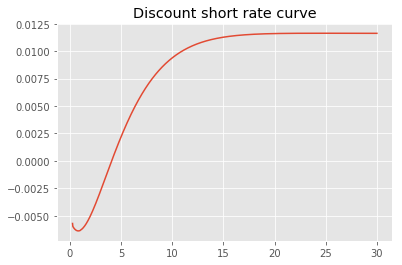

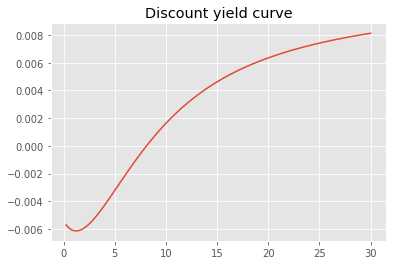

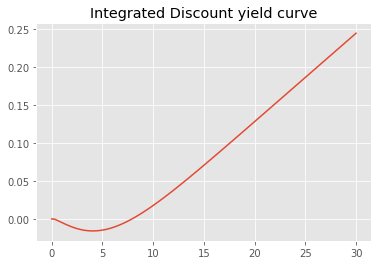

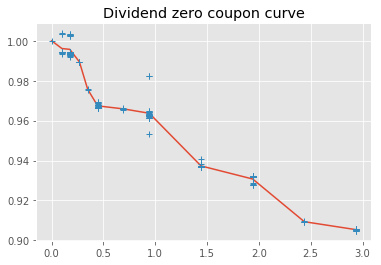

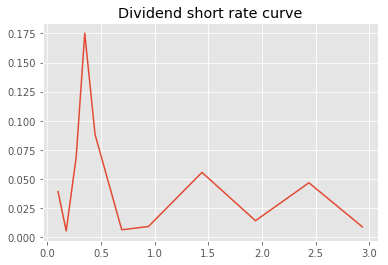

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


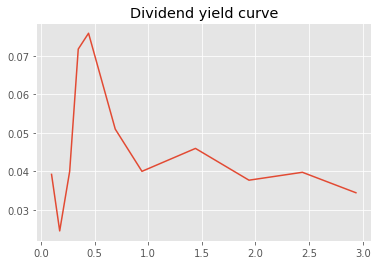

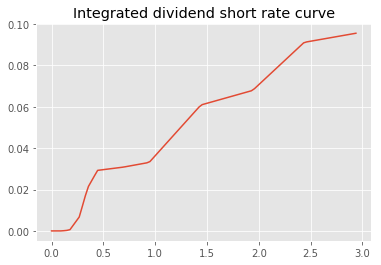

In [317]:
workingFolder = "./data/"
asOfDate = "2019-01-10"
filename = "Data_EuroStoxx50_20190110_all_for_Marc.xlsx"
trainingSet, testingSet, bootstrap, S0 = loadData.loadESXData(workingFolder, filename, asOfDate)

In [192]:
bootstrap.discountShortRate(10)

array(0.009402)

In [118]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

# Formatting data

### Boostsrapping Rate Curve


- For bootstrapping short rate $r$ and dividend rate $q$, we assume piecewise constant short rate for risk free rate and dividend i.e. 
$\exp{(-\int_{0}^{T} r_t d_t)} = \exp{(-\sum_{i} r_i h)}$ and $\exp{(\int_{0}^{T} q_t d_t)} = \exp{(\sum_{i} q_i h)}$.
- $\forall i \in \{0,..,N\}$ with $ t_0 = 0$ and $t_N = T$, we have that $\frac{\log{B(0,t_{i+1})} - \log{B(0,t_i)}}{h} = r_i$ with $B(0,T_i)$ the price of a bond expiring at time $t_i$. 
- For dividend, we just to substitute $B(0,T_i)$ with with spot action price plus dividend cash flow received until time $T_i$ i.e. $S_{t_0} + \sum\limits_i Div_{t_i}$.
- Then we linearly interpolate $r$ and $q$.
-  Linear interpolation is also used for integrals $\int_{0}^{T} q_t d_t$ and $\int_{0}^{T} r_t d_t$ in order to obtain discount factor or dividend factor. 

**riskFreeIntegral** corresponds to $I_T = \int_{0}^{T} r_u du$.
**riskFreeSpline**  corresponds to $r_u$ evaluated on a subgrid. Interpolated as step function from zero coupons

**divSpreadIntegral** corresponds to $I_T = \int_{0}^{T} q_u du$, can be negative.
**divSpline**  corresponds to $q_u$ evaluated on a subgrid, can be negative.

Training dataset is built on market prices observed on the dax.
Testing dataset is list of prices drawn from an excel provided by Stephane Crépey.
Prices come from the calibrated local volatility with tikhonov regularisation (see Crépey 2002 paper).
Implied volatitilities in both dataset are obtained from local volatility.

These curve satisfy together the call put parity.

Spot level is contained in underlying.csv

### Pricing black-scholes price

#### Change of variable

- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q) K \partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.

- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we should obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.


In [43]:
dataSetConstruction.checkCallPutParity(pd.concat([trainingSet, testingSet]), 
                                       S0, 
                                       bootstrap)

ValueError: attempt to get argmax of an empty sequence

In [6]:
dataSet = trainingSet #Training set
dataSetTest = testingSet #Testing set
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


In [7]:
dataSetTest.head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                            
1700.0 0.246      0.80 -0.004171   17.445534      0.009788     -0.000018   
2300.0 0.419     14.30 -0.069169  246.251489      0.132054      0.000036   
2350.0 0.093      1.20 -0.013019   29.227795      0.022052     -0.000041   
       0.112      1.85 -0.018041   42.445051      0.030966     -0.000041   
2400.0 0.419     20.55 -0.099289  323.155078      0.185544      0.000106   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
1700.0 0.246      15.329284    1697.643924        0.997527  1700.0     0.246   
2300.0 0.419     140.724773    2294.306350        0.994628  2300.0     0.419   
2350.0 0.093      66.591651    2348.768497        1.000292  2350.0     0.093   
       0.112      82.136307    2348.122910        1.000111  2350.0     0.112   
2400.0 0.419     187.583551    2394.058800        0.994628  2400.0     0.419   

                 ImpliedVol     VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                     
1700.0 0.246         0.4147    0.062925        -1.0     -0.521416   
2300.0 0.419         0.2424  261.160274        -1.0     -0.220227   
2350.0 0.093         0.2959   11.271760        -1.0     -0.196766   
       0.112         0.2875   21.589857        -1.0     -0.197041   
2400.0 0.419         0.2264  368.610408        -1.0     -0.177667   

                 impliedTotalVariance  
Strike Maturity                        
1700.0 0.246                 0.042306  
2300.0 0.419                 0.024620  
2350.0 0.093                 0.008143  
       0.112                 0.009257  
2400.0 0.419                 0.021477

In [8]:
dfCurve = dataSetConstruction.savingData(bootstrap, 
                                         dataSet, 
                                         dataSetTest, 
                                         workingFolder)

Saving bootstrapping under dfCurve.csv
Saving training set under trainingDataSet.csv
Saving bootstrapping under testingDataSet.csv


In [9]:
dataSet.shape

(135, 15)

In [10]:
dataSetTest.shape

(144, 15)

In [11]:
S0

2859.53

In [12]:
def getCall(df):
    return df[df["OptionType"]==1]
def getPut(df):
    return df[df["OptionType"]==-1]

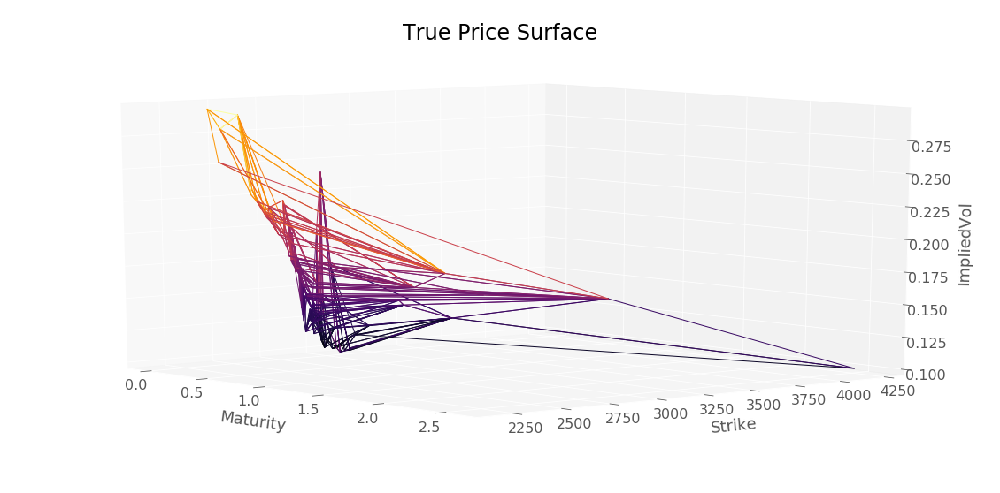

In [13]:
plotTools.plotSerie(getPut(trainingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

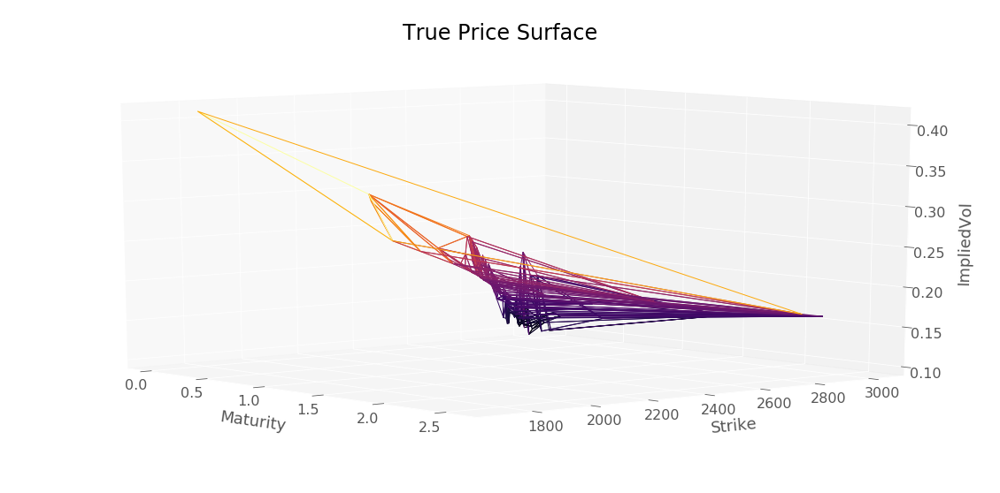

In [14]:
plotTools.plotSerie(getPut(testingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

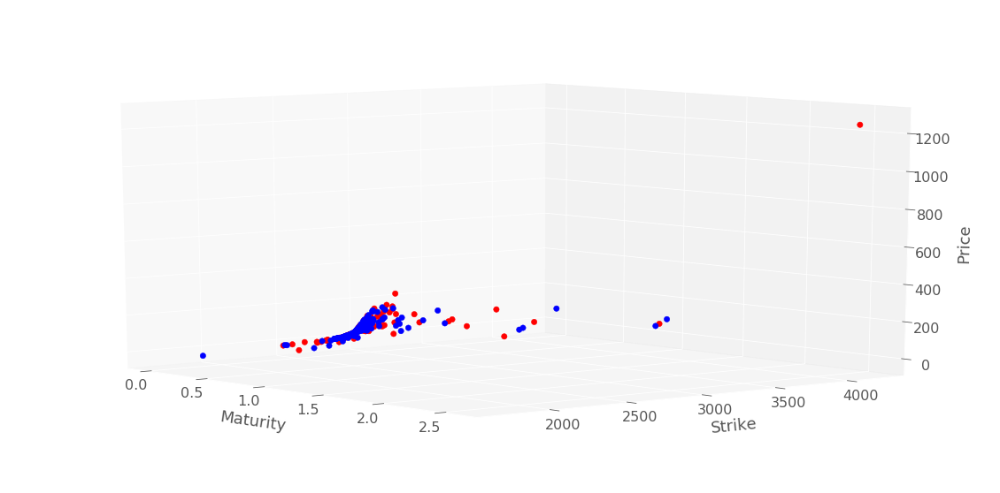

In [15]:
plotTools.plot2Series(getPut(testingSet)["Price"], 
                      getPut(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0, 
                      Title = 'True Price Surface')

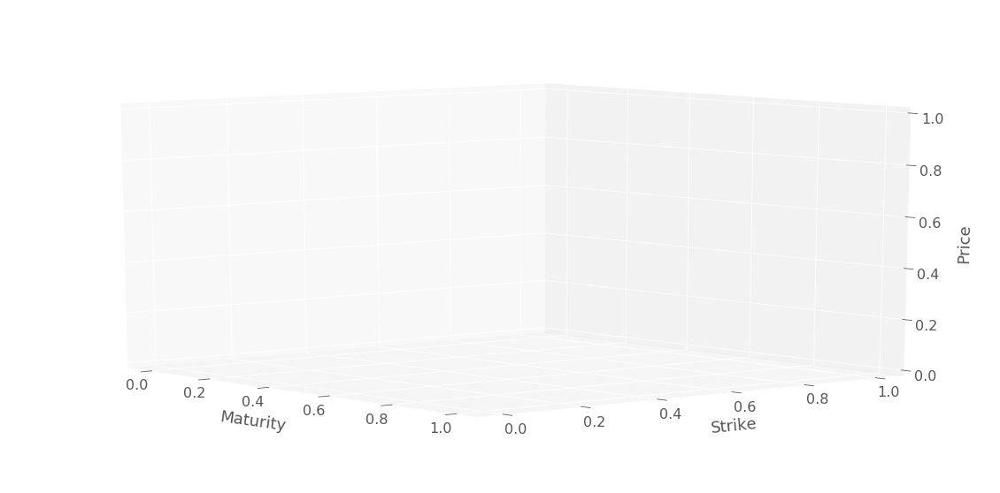

In [16]:
plotTools.plot2Series(getCall(testingSet)["Price"], 
                      getCall(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0,
                      Title = 'True Price Surface')

In [17]:
testingSet.shape

(144, 15)

In [18]:
trainingSet.shape

(135, 15)

In [19]:
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


## Scaling methods

Use min-max of scaling strike between 0 et 1 for improving stability of neural network training. 

$f(x) = \mu_f + s_f * f_{scaled}(x_{scaled}) $

where $x_{scaled} = \frac{x - \mu_x}{s_x}$

$\sigma(k,t) = \sqrt{2 \frac{\partial_{t} f(k,t)}{k^2 \partial_{k^2} f(k,t)}}$

$\tilde{k} = \frac{k - \mu_k}{s_k}$

$\tilde{t} = \frac{t - \mu_t}{s_t}$

$t = \mu_t + s_t * \tilde{t}$

$k = \mu_k + s_k * \tilde{k}$

$\partial_{t} f(k,t) = \partial_{t} f(\tilde{k}, \tilde{t}) = \partial_{\tilde{t}} f(\tilde{k}, \tilde{t}) \partial_{t} \tilde{t}$


In [20]:
activateScaling = False
transformCustom = dataSetConstruction.transformCustomMinMax if activateScaling else dataSetConstruction.transformCustomId
inverseTransform = dataSetConstruction.inverseTransformMinMax if activateScaling else dataSetConstruction.inverseTransformId
inverseTransformColumn = dataSetConstruction.inverseTransformColumnMinMax if activateScaling else dataSetConstruction.inverseTransformColumnId
inverseTransformColumnGreeks = dataSetConstruction.inverseTransformColumnGreeksMinMax if activateScaling else dataSetConstruction.inverseTransformColumnGreeksId

In [21]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = transformCustom(dataSet, scaler)
scaledDataSetTest = transformCustom(dataSetTest, scaler)

In [22]:
scaledDataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


In [23]:
#Search strike for ATM option
midS0 = dataSet[dataSet.index.get_level_values("Strike") >= S0].index.get_level_values("Strike").min()

## Plot functions

In [24]:
KMin = 0#0.7 * S0[0]
KMax = 2.0 * S0#1.3 * S0[0]


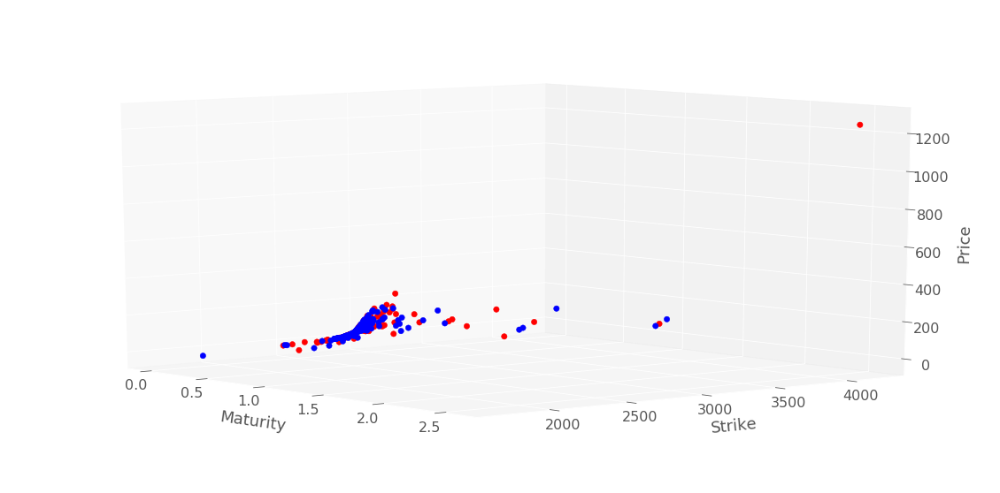

In [25]:
plotTools.plot2Series(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                      dataSet[dataSet.Maturity > 0]["Price"], 
                      yMin=KMin,
                      yMax=KMax, 
                      Title = 'True Price Surface')

In [26]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

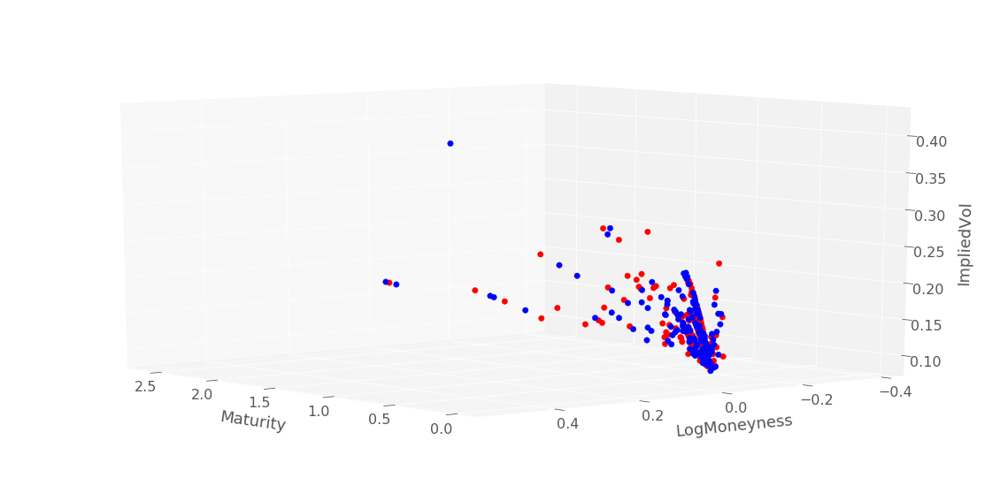

In [27]:
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[dataSetTest.Maturity > 0], S0)["ImpliedVol"], 
                      plotTools.convertToLogMoneyness(dataSet[dataSet.Maturity > 0], S0)["ImpliedVol"], 
                      yMin=-1000,
                      yMax=1000, 
                      Title = 'True Implied vol Surfaces', 
                      az=140)

In [28]:
plt.get_cmap("plasma")(0)

(0.050383, 0.029803, 0.527975, 1.0)

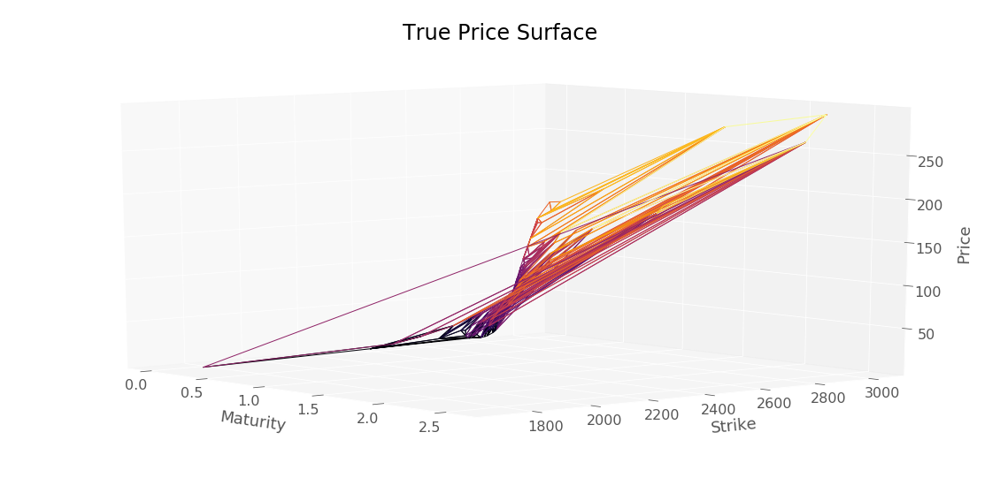

In [29]:
plotTools.plotSerie(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

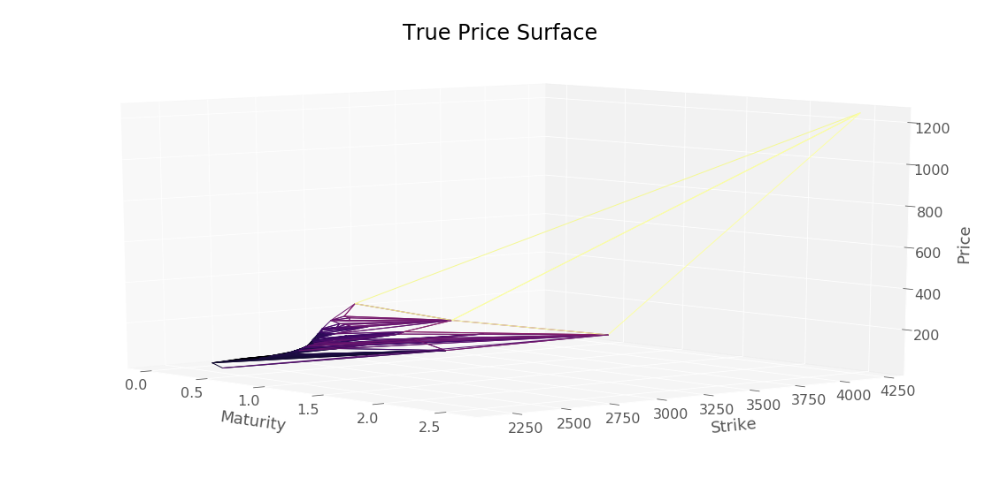

In [30]:
plotTools.plotSerie(dataSet["Price"],
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

In [31]:
inverseTransform(scaledDataSet, scaler).head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


In [32]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [33]:
df1 = loadData.removeDataViolatingStaticArbitrage(trainingSet)
df1.shape

(131, 15)

In [34]:
df2 = loadData.removeDataViolatingStaticArbitrage(df1)
df2.shape

(131, 15)

In [35]:
df3 = loadData.removeDataViolatingStaticArbitrage(df2)
df3.shape

(131, 15)

### Implied volatility function calibration by bissection

Strike :  2835.0  NbViolations :  1
0.074    True
dtype: bool
0.036    0.000849
0.074    0.000758
dtype: float64
Strike :  2850.0  NbViolations :  1
2.585    True
dtype: bool
1.588    0.039284
2.585    0.032892
dtype: float64
Strike :  2875.0  NbViolations :  2
0.074     True
0.112    False
0.189    False
0.285    False
0.591    False
0.841     True
dtype: bool
0.036    0.000665
0.074    0.000646
0.112    0.000763
0.189    0.001553
0.285    0.001994
0.591    0.007003
0.841    0.006171
dtype: float64


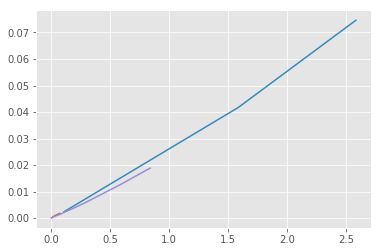

In [36]:
for strike in dataSet.rename({"Strike" : "StrikeColumn"}, axis=1).groupby("StrikeColumn"):
    impliedTotVariance = np.square(strike[1]["ImpliedVol"]) * strike[1]["Maturity"]
    sortedStrike = pd.Series(impliedTotVariance.values, 
                             index  = strike[1]["Maturity"].values).sort_index().diff().dropna()
    thetaViolation = sortedStrike.diff().dropna()
    if (thetaViolation < 0).sum() > 0 :
        plt.plot(strike[1]["Maturity"].values, impliedTotVariance.values, label = str(strike[0]))
        print("Strike : ", strike[0], " NbViolations : ", (thetaViolation < 0).sum())
        print((thetaViolation < 0))
        print(sortedStrike)

In [37]:
%matplotlib inline

In [38]:
360 * 0.093

33.48

# SSVI Model

In [39]:
import SSVI


In [40]:
np.seterr(all='warn')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [41]:
dataSet = dataSet[dataSet["Maturity"] > 0]
dataSetTest = dataSetTest[dataSetTest["Maturity"] > 0]


In [42]:
dataSet.columns

Index(['Price', 'Delta', 'Vega', 'Delta Strike', 'Gamma Strike', 'Theta',
       'ChangedStrike', 'DividendFactor', 'Strike', 'Maturity', 'ImpliedVol',
       'VegaRef', 'OptionType', 'logMoneyness', 'impliedTotalVariance'],
      dtype='object')

In [43]:
importlib.reload(SSVI)

<module 'SSVI' from './code/SSVI.py'>

In [44]:
#parameters, theta, maturities, pSSVI = SSVI.train_svi_surface(dataSet, S0)
SSVIModel = SSVI.SSVIModel(S0, bootstrap)
SSVIModel.fit(dataSet)

Contrainte :  -0.4911940851433907
Parameters of SSVI model :  [-0.82597945  0.82629951  0.5       ]
time step 25  :  2.585
Contrainte :  0.07083135597373424
time step 24  :  1.588
Contrainte :  0.06773186362215022
time step 23  :  1.09
Contrainte :  0.06997518772201927
time step 22  :  0.841
Contrainte :  0.07085193668512135
time step 21  :  0.591


./code/SSVI.py:617: RuntimeWarning: invalid value encountered in sqrt
  alpha = np.sign(beta) * np.sqrt(1 / beta ** 2 - 1)
./code/SSVI.py:619: RuntimeWarning: invalid value encountered in sqrt
  (b * (-rho + np.sign(alpha) * np.sqrt(1 + alpha ** 2) - alpha * np.sqrt(1 - rho ** 2))))
./code/SSVI.py:630: RuntimeWarning: invalid value encountered in sqrt
  a = vt * tau - b * sigma * np.sqrt(1 - rho ** 2)
./code/SSVI.py:324: RuntimeWarning: invalid value encountered in less
  if any(model_total_implied_variance < before_total_implied_variance) :
./code/SSVI.py:331: RuntimeWarning: invalid value encountered in greater
  if any(model_total_implied_variance > after_total_implied_variance) :


Contrainte :  0.023686785395924614
time step 20  :  0.419
Contrainte :  0.07156981332860302
time step 19  :  0.342
Contrainte :  0.07152243330322106
time step 18  :  0.285
Contrainte :  0.07105469119531549
time step 17  :  0.246
Contrainte :  0.07149539734681942
time step 16  :  0.203
Contrainte :  0.07171487806346266
time step 15  :  0.189
Contrainte :  0.07175327652307462
time step 14  :  0.17
Contrainte :  0.07165408553191244
time step 13  :  0.151
Contrainte :  0.07066898085898654
time step 12  :  0.131
Contrainte :  0.07791738525297143
time step 11  :  0.112
Contrainte :  0.07171821685481095
time step 10  :  0.093
Contrainte :  0.07456620233137567
time step 9  :  0.07400000000000001
Contrainte :  0.07223030476914838
time step 8  :  0.063
Contrainte :  0.07225066466481167
time step 7  :  0.055
Contrainte :  0.07209711856799494
time step 6  :  0.044
Contrainte :  0.08820367982363053
time step 5  :  0.036000000000000004
Contrainte :  0.07144095974821152
time step 4  :  0.03
Contraint

In [45]:
serie = SSVIModel.eval(dataSetTest)

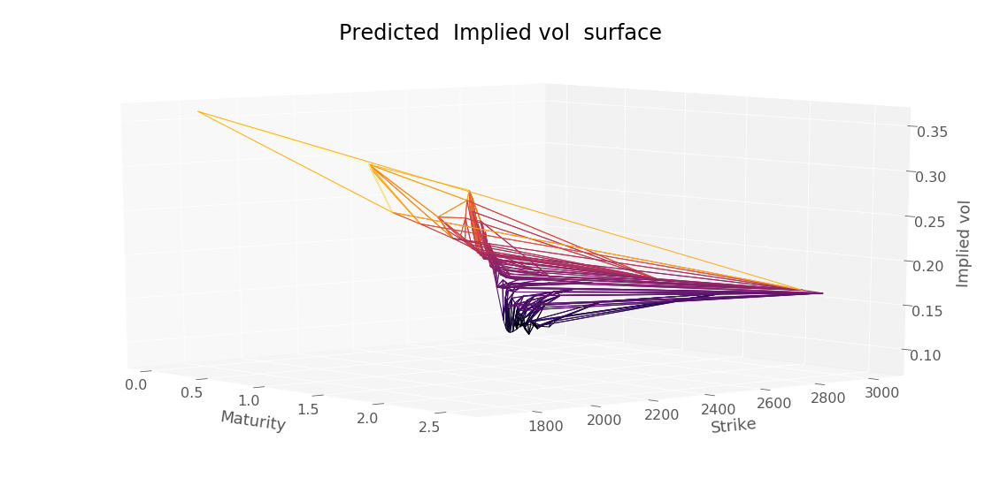

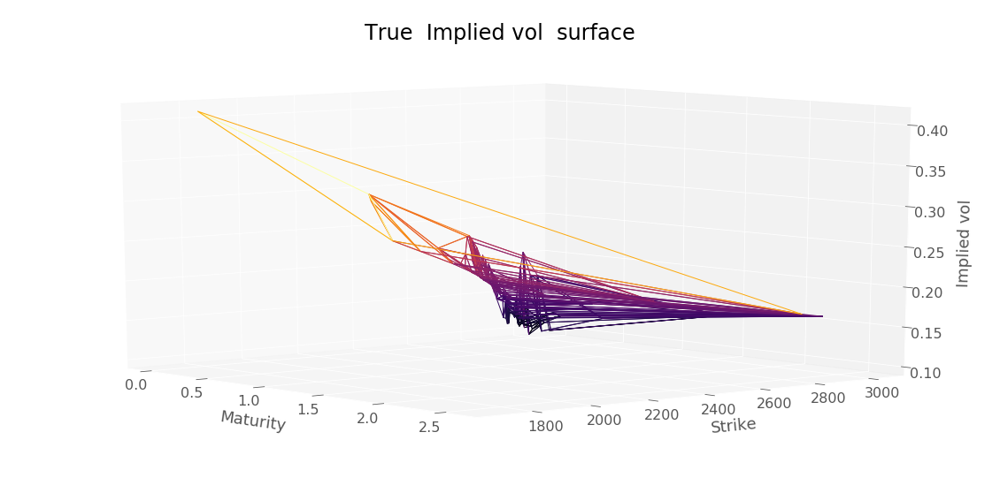

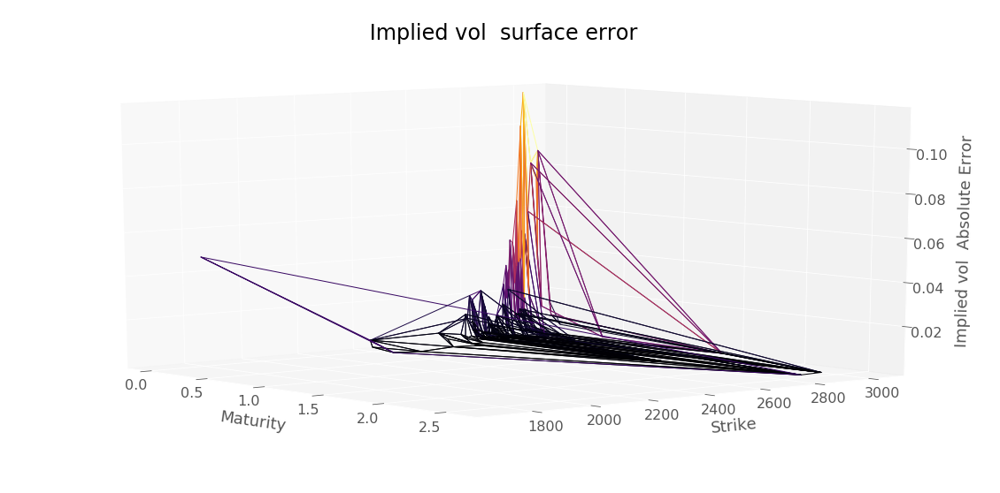

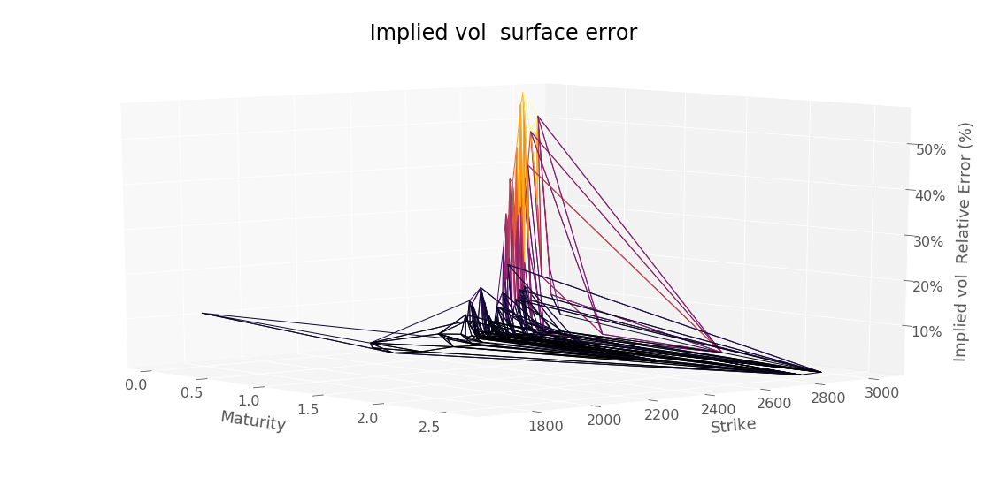

RMSE :  0.02405416565253185


In [46]:
plotTools.predictionDiagnosis(serie, 
                              dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"], 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

In [47]:
SSVIModel.theta

array([9.97942711e-05, 2.89964396e-04, 4.43587880e-04, 5.84508094e-04,
       6.50353184e-04, 8.31341078e-04, 9.48056113e-04, 1.19218892e-03,
       1.19218892e-03, 1.51775913e-03, 1.91191915e-03, 2.30351969e-03,
       2.65643410e-03, 3.55628722e-03, 3.55628722e-03, 3.85922235e-03,
       4.14094124e-03, 5.14466491e-03, 5.89771838e-03, 7.10990355e-03,
       9.12314082e-03, 1.28888977e-02, 1.89326783e-02, 2.57710925e-02,
       4.03319093e-02, 7.30112403e-02])

In [48]:
SSVIModel.maturities

array([0.005, 0.011, 0.016, 0.027, 0.03 , 0.036, 0.044, 0.055, 0.063,
       0.074, 0.093, 0.112, 0.131, 0.151, 0.17 , 0.189, 0.203, 0.246,
       0.285, 0.342, 0.419, 0.591, 0.841, 1.09 , 1.588, 2.585])

In [49]:
SSVIModel.forward_theta

array([2859.53      , 2859.82165476, 2860.08421196, 2860.34511199,
       2860.44453937, 2860.422368  , 2860.56580578, 2860.21056348,
       2860.47660318, 2860.20868774, 2861.02930535, 2861.81590935,
       2862.27434955, 2862.23165804, 2863.13237726, 2864.52719273,
       2864.7281759 , 2863.4986006 , 2864.81062992, 2865.27995551,
       2866.6263338 , 2868.76286197, 2873.40461311, 2876.01428498,
       2878.71385769, 2886.85557653])

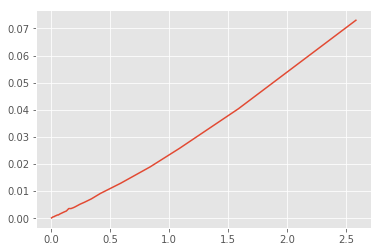

In [50]:
plt.plot(SSVIModel.maturities, SSVIModel.theta)#np.sqrt(theta/maturities))#theta)

In [51]:
SSVIModel.theta

array([9.97942711e-05, 2.89964396e-04, 4.43587880e-04, 5.84508094e-04,
       6.50353184e-04, 8.31341078e-04, 9.48056113e-04, 1.19218892e-03,
       1.19218892e-03, 1.51775913e-03, 1.91191915e-03, 2.30351969e-03,
       2.65643410e-03, 3.55628722e-03, 3.55628722e-03, 3.85922235e-03,
       4.14094124e-03, 5.14466491e-03, 5.89771838e-03, 7.10990355e-03,
       9.12314082e-03, 1.28888977e-02, 1.89326783e-02, 2.57710925e-02,
       4.03319093e-02, 7.30112403e-02])

In [52]:

serieDf = SSVIModel.eval(dataSetTest)

In [53]:
imp = dataSetTest["ImpliedVol"]

In [54]:
serieDf[serieDf.index.get_level_values("Maturity")==0.005] - imp[imp.index.get_level_values("Maturity")==0.005]

Strike  Maturity
2795.0  0.005       0.022681
2800.0  0.005       0.019795
2810.0  0.005       0.014900
2820.0  0.005       0.009161
2840.0  0.005      -0.001684
2845.0  0.005      -0.004079
2850.0  0.005      -0.007734
2855.0  0.005      -0.010248
2880.0  0.005      -0.024926
2890.0  0.005      -0.033918
2895.0  0.005      -0.029687
2900.0  0.005      -0.031581
2905.0  0.005      -0.045947
2915.0  0.005      -0.044557
2930.0  0.005      -0.064670
2945.0  0.005      -0.100119
2955.0  0.005      -0.115999
dtype: float64

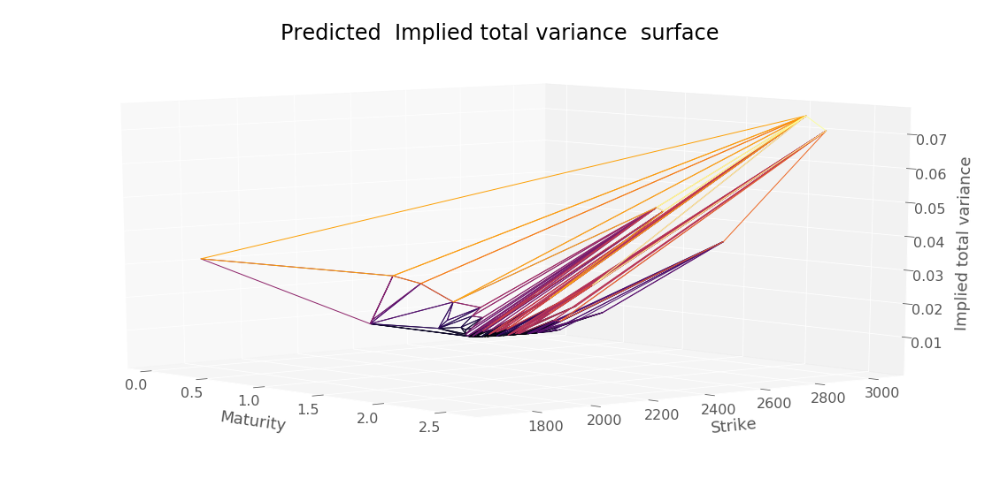

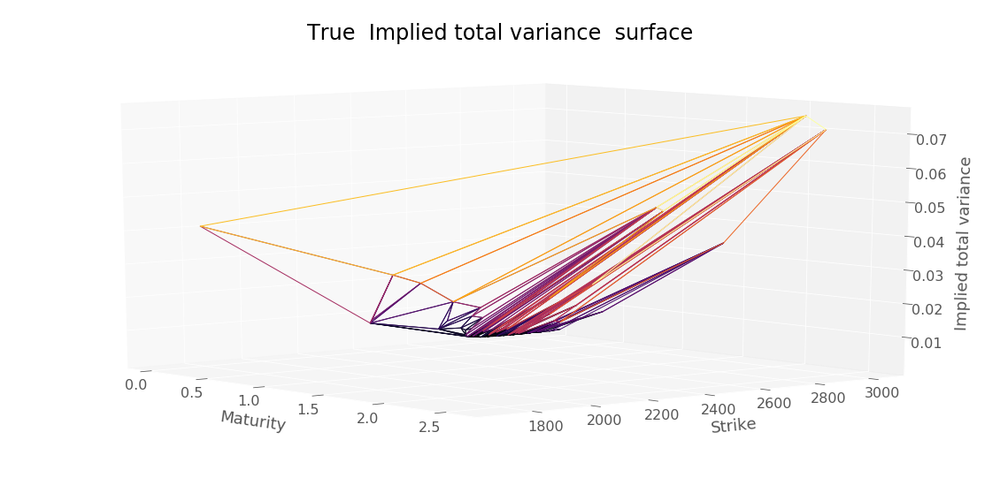

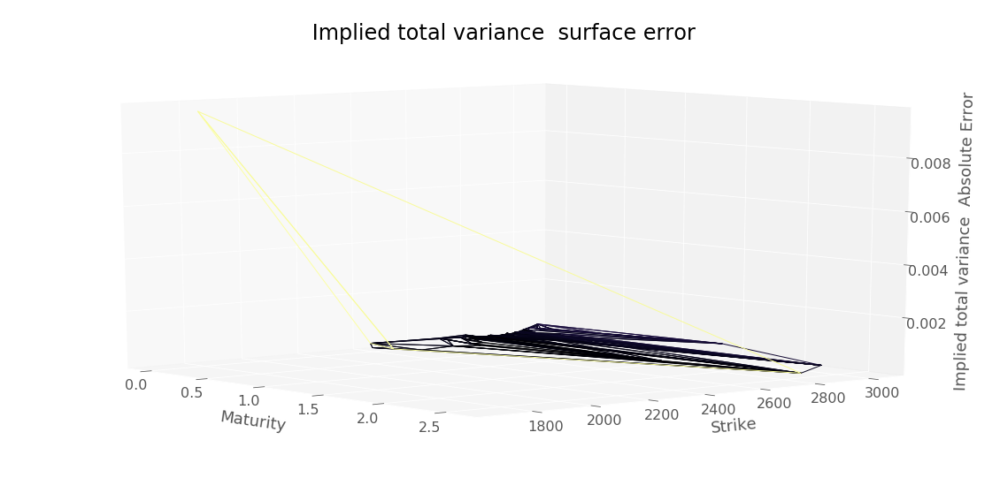

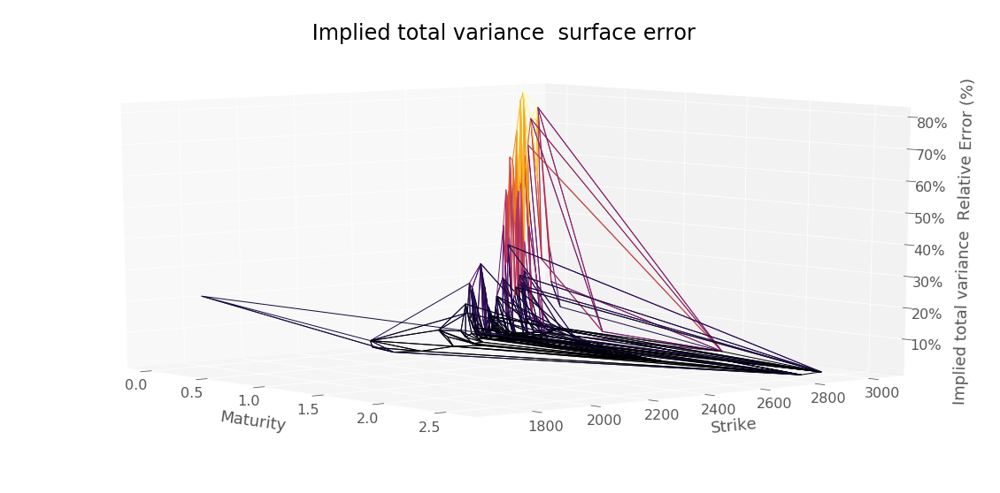

RMSE :  0.0008148004964725176


In [55]:
plotTools.predictionDiagnosis(SSVI.impliedVariance(serieDf), 
                              SSVI.impliedVariance(dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"]), 
                              " Implied total variance ", 
                              yMin=KMin, 
                              yMax=KMax)

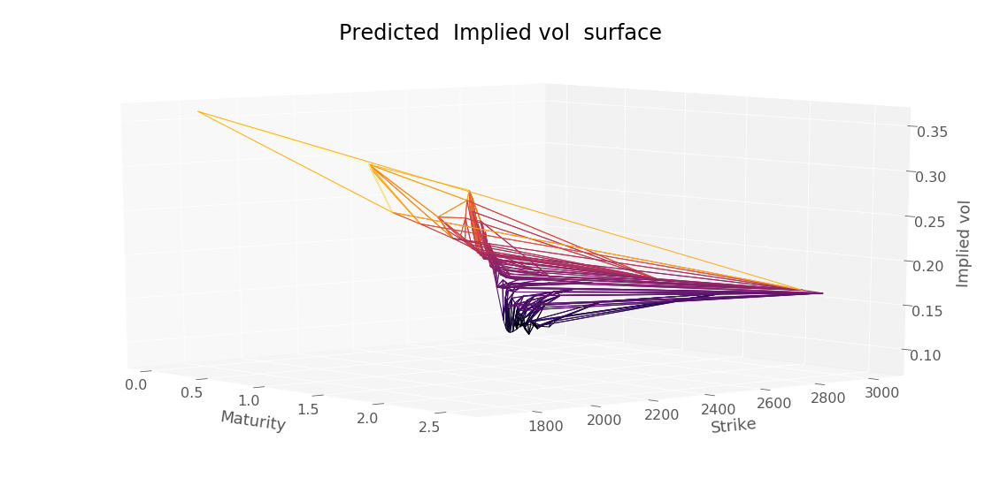

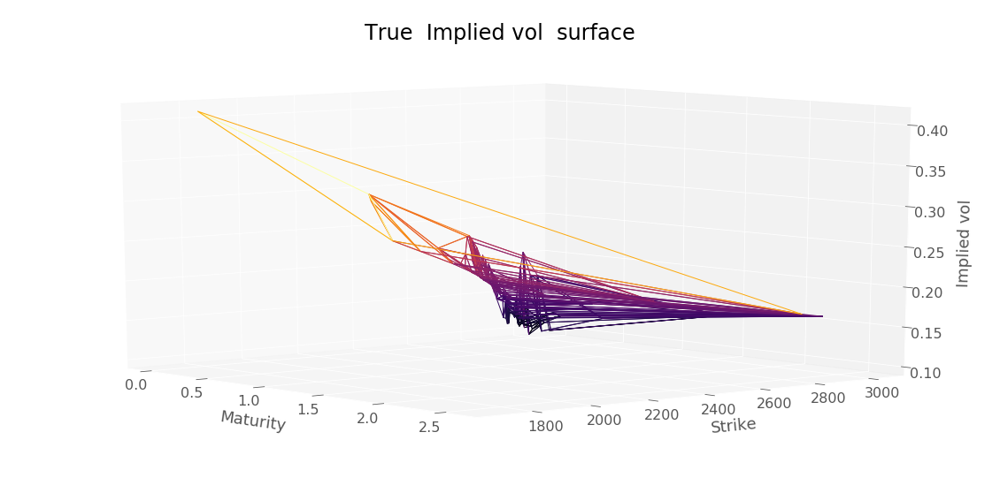

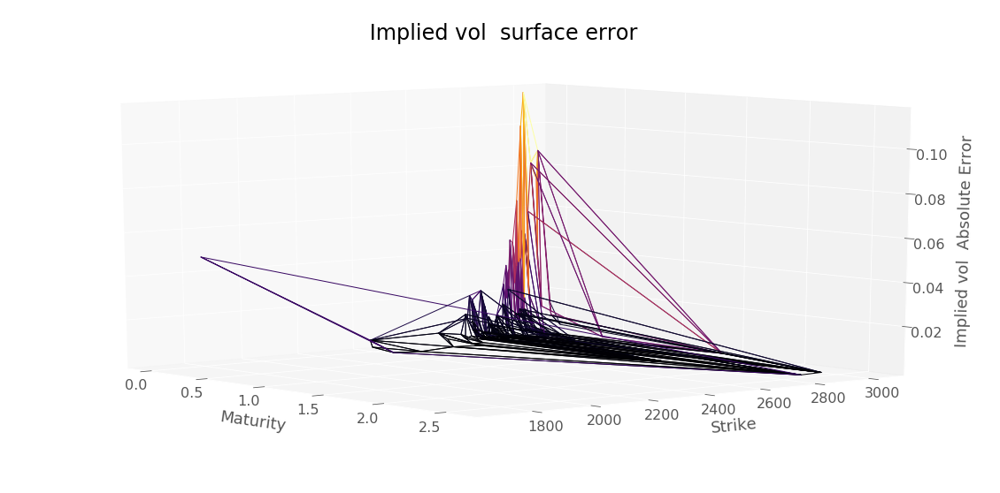

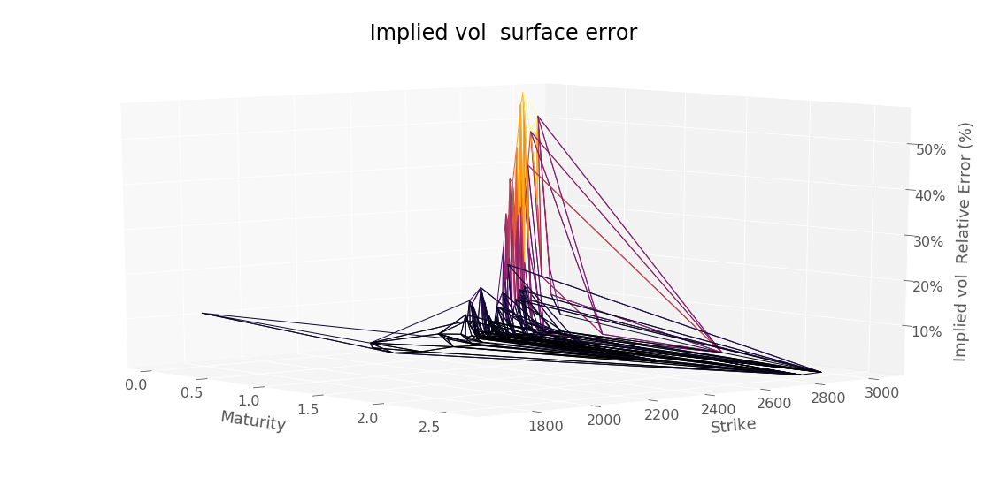

RMSE :  0.02405416565253185


In [56]:
plotTools.predictionDiagnosis(serieDf, 
                              dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"], 
                              " Implied vol ", 
                              yMin=KMin, 
                              yMax=KMax)

In [57]:
dataSet.head(20)

Price     Delta         Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                              
2200.0 0.419       9.95 -0.047968   184.678147      0.094049 -9.963916e-07   
2325.0 0.112       1.65 -0.015858    38.013410      0.027412 -3.969604e-05   
2400.0 0.093       1.60 -0.017779    38.199664      0.029753 -4.470370e-05   
2510.0 0.170       9.15 -0.074660   166.318158      0.128221  5.540400e-05   
2525.0 0.036       0.55 -0.010731    15.378146      0.016613 -5.456899e-05   
       0.342      25.50 -0.137671   367.981139      0.248778  2.340929e-04   
2550.0 0.112       6.25 -0.063439   119.069171      0.105505  2.644124e-05   
       0.151       9.80 -0.084634   172.349631      0.143771  8.937826e-05   
2580.0 0.170      13.60 -0.109530   221.016358      0.187402  1.779363e-04   
2590.0 0.170      14.20 -0.115349   229.343638      0.197289  2.024247e-04   
2625.0 0.093       7.80 -0.088772   140.171370      0.145683  1.240935e-04   
       0.112      10.40 -0.105018   174.035016      0.174797  1.863909e-04   
       0.342      37.40 -0.200995   469.571390      0.361172  4.962844e-04   
2650.0 0.170      19.90 -0.160133   287.023921      0.274638  4.207963e-04   
       1.588     146.85 -0.316537  1282.740823      0.632826  5.748307e-04   
2675.0 0.044       3.45 -0.063038    74.262589      0.098522  3.151244e-05   
2685.0 0.027       1.50 -0.036113    37.250394      0.054515 -7.296216e-05   
2700.0 0.591      78.45 -0.302331   767.005036      0.564019  8.194175e-04   
2725.0 0.131      24.25 -0.218669   305.382561      0.374104  8.786477e-04   
2750.0 0.093      20.30 -0.225090   261.594705      0.380580  1.095306e-03   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
2200.0 0.419     103.538454    2194.553900        0.994628  2200.0     0.419   
2325.0 0.112      73.268907    2323.142879        1.000111  2325.0     0.112   
2400.0 0.093      88.192154    2398.742294        1.000292  2400.0     0.093   
2510.0 0.170     230.171845    2506.841932        0.999189  2510.0     0.170   
2525.0 0.036      87.679835    2524.212274        1.000312  2525.0     0.036   
       0.342     262.508359    2519.932908        0.995921  2525.0     0.342   
2550.0 0.112     246.324015    2547.963157        1.000111  2550.0     0.112   
       0.151     270.205079    2547.593057        0.999325  2550.0     0.151   
2580.0 0.170     310.882907    2576.753858        0.999189  2580.0     0.170   
2590.0 0.170     322.882165    2586.741276        0.999189  2590.0     0.170   
2625.0 0.093     353.835665    2623.624384        1.000292  2625.0     0.093   
       0.112     368.999408    2622.903250        1.000111  2625.0     0.112   
       0.342     329.769236    2619.732231        0.995921  2625.0     0.342   
2650.0 0.170     404.998220    2646.665785        0.999189  2650.0     0.170   
       1.588     176.415588    2632.340300        0.973863  2650.0     1.588   
2675.0 0.044     379.560152    2674.031387        1.000362  2675.0     0.044   
2685.0 0.027     294.020421    2684.234856        1.000285  2685.0     0.027   
2700.0 0.591     285.721587    2691.310287        0.991511  2700.0     0.591   
2725.0 0.131     547.004714    2722.387269        0.999817  2725.0     0.131   
2750.0 0.093     655.305338    2748.558879        1.000292  2750.0     0.093   

                 ImpliedVol      VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                      
2200.0 0.419         0.2586   169.246997        -1.0     -0.264678   
2325.0 0.112         0.2958    15.762704        -1.0     -0.207736   
2400.0 0.093         0.2798    22.362901        -1.0     -0.175713   
2510.0 0.170         0.2289   194.599716        -1.0     -0.131634   
2525.0 0.036         0.2893     6.408137        -1.0     -0.124728   
       0.342         0.2100   429.765404        -1

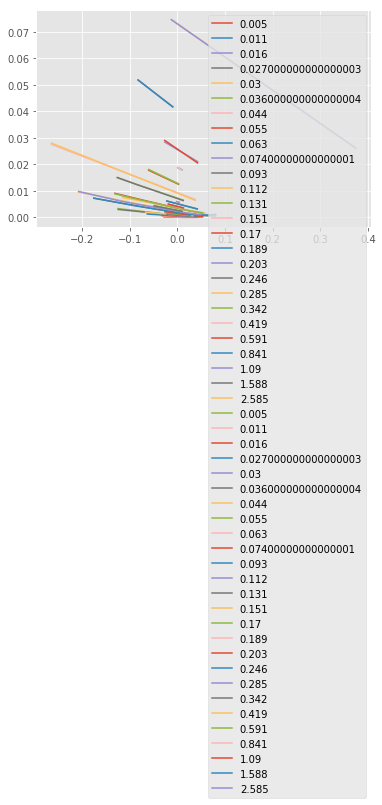

In [58]:
#interpolationBind = lambda x : SSVI.interpolateGrid(x, parameters, 
#                                                    theta, 
#                                                    maturities, 
#                                                    interestrate_theta,
#                                                    forward_theta,
#                                                    S0,
#                                                    bootstrap)
interpolationBind = lambda x : SSVIModel.eval(x)
plotTools.plotEachSmilePred(dataSet, interpolationBind)
plotTools.plotEachSmile(dataSet)
plt.show()

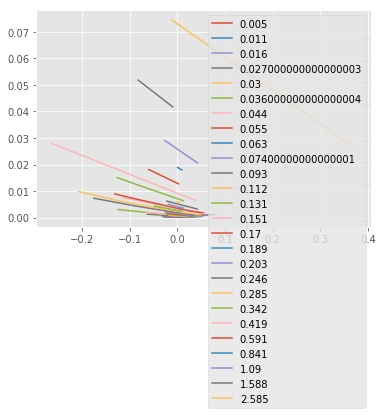

In [59]:
plotTools.plotEachSmile(dataSet)
plt.show()

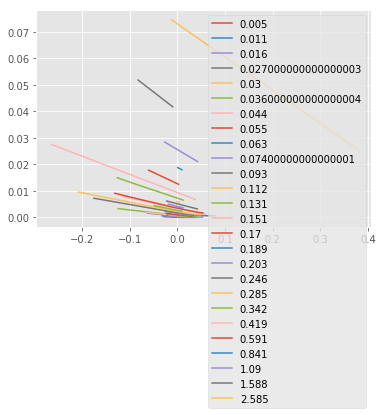

In [60]:
plotTools.plotEachSmilePred(dataSet, interpolationBind)
plt.show()

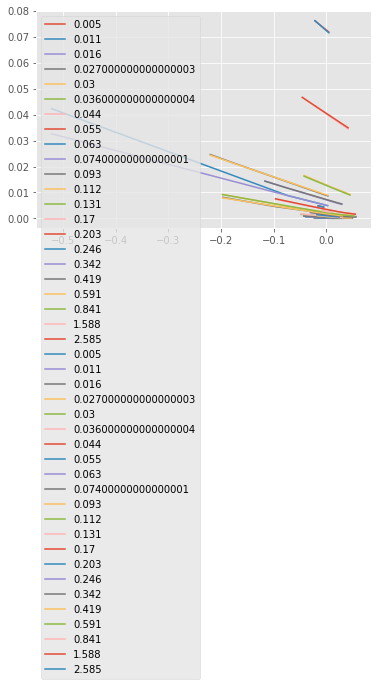

In [61]:
plotTools.plotEachSmile(dataSetTest)
plotTools.plotEachSmilePred(dataSetTest, interpolationBind)
plt.show()

In [62]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

In [63]:
s = dataSet[dataSet["Strike"]<=3000]["Strike"].max()
s

3000.0

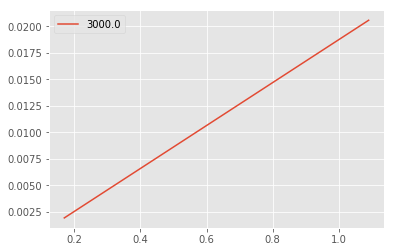

In [64]:
plotTools.plotEachStrike(dataSet[dataSet["Strike"]==s])

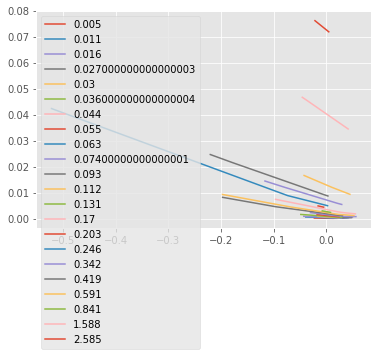

In [65]:
plotTools.plotEachSmile(dataSetTest)
plt.show()

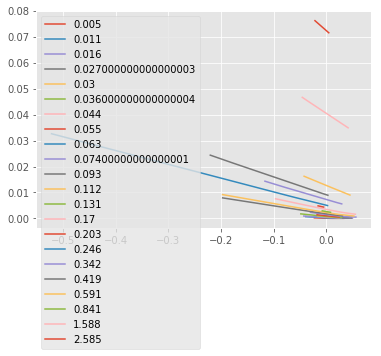

In [66]:
plotTools.plotEachSmilePred(dataSetTest, interpolationBind)
plt.show()

In [67]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(dataSetTest, interpolationBind)

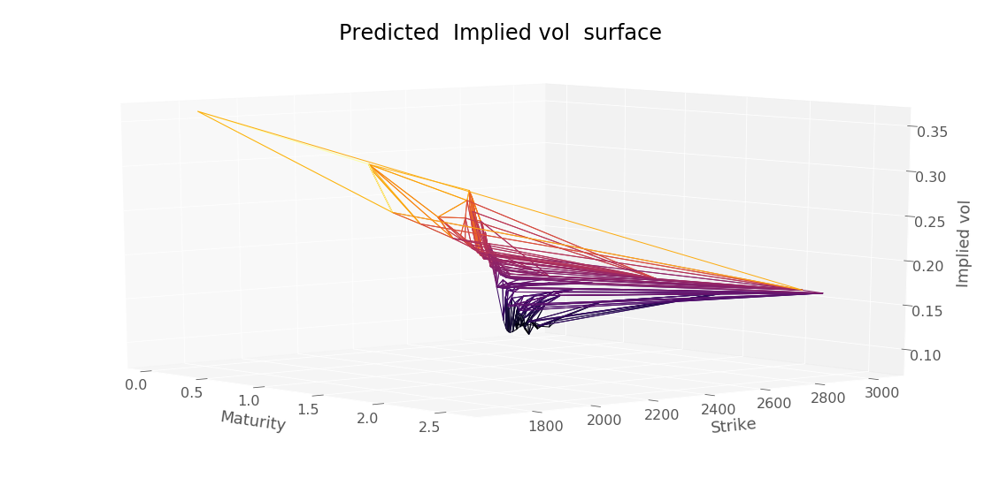

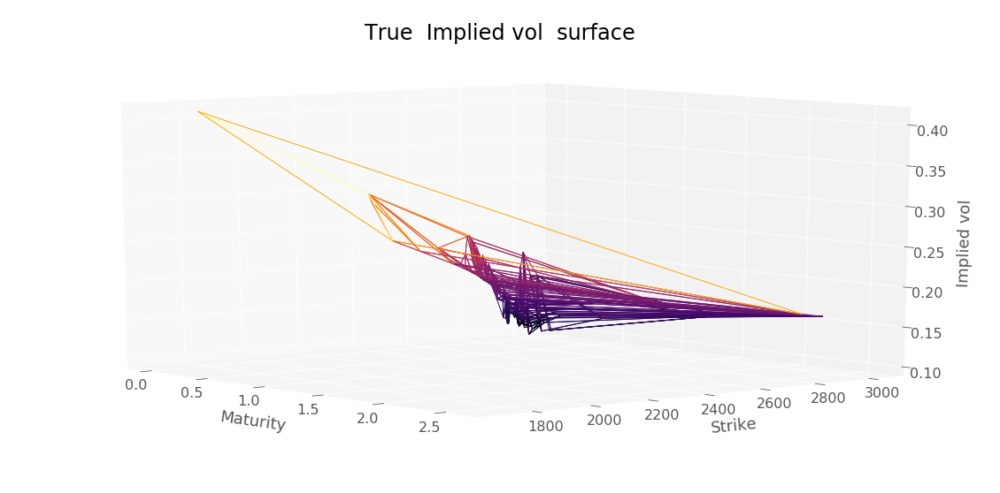

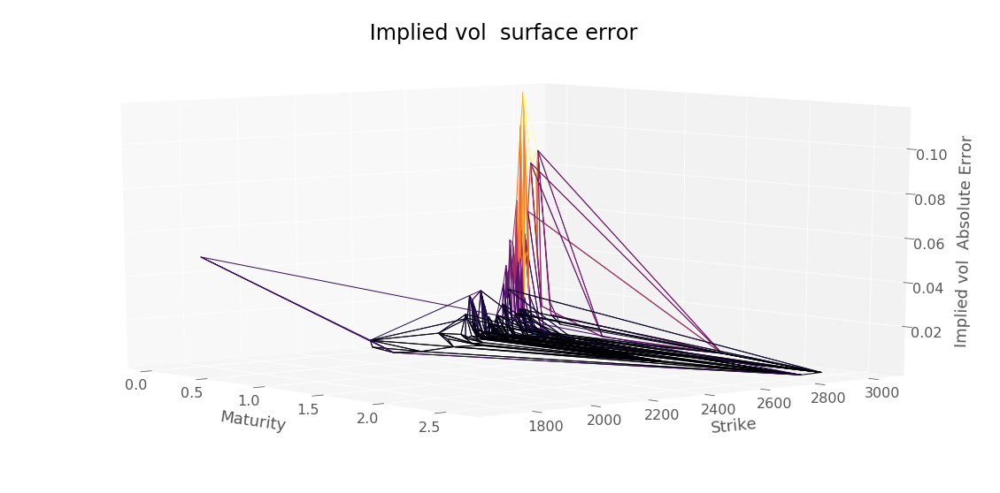

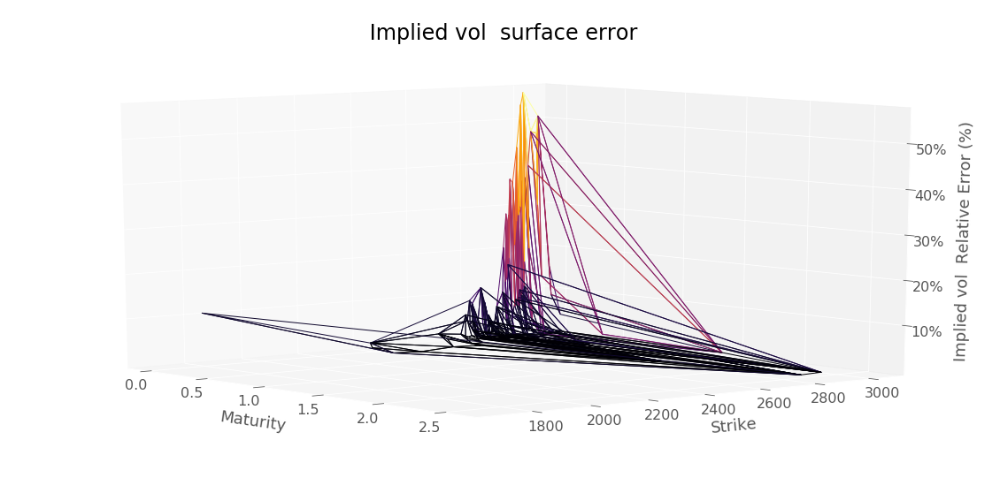

RMSE :  0.02405416565253185


In [68]:
plotTools.predictionDiagnosis(serie, 
                              dataSetTest["ImpliedVol"], 
                              " Implied vol ",
                              yMin=KMin, 
                              yMax=KMax)

In [69]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

Number of arbitrage violations :  0
Arbitrable volatility :  Series([], Name: ImpliedVol, dtype: float64)
Interpolated Arbitrable volatility :  Series([], dtype: float64)


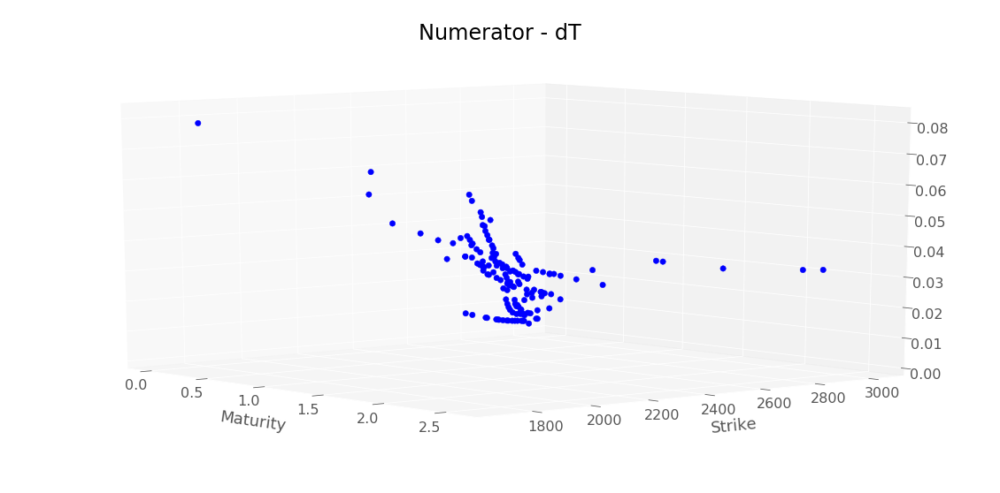

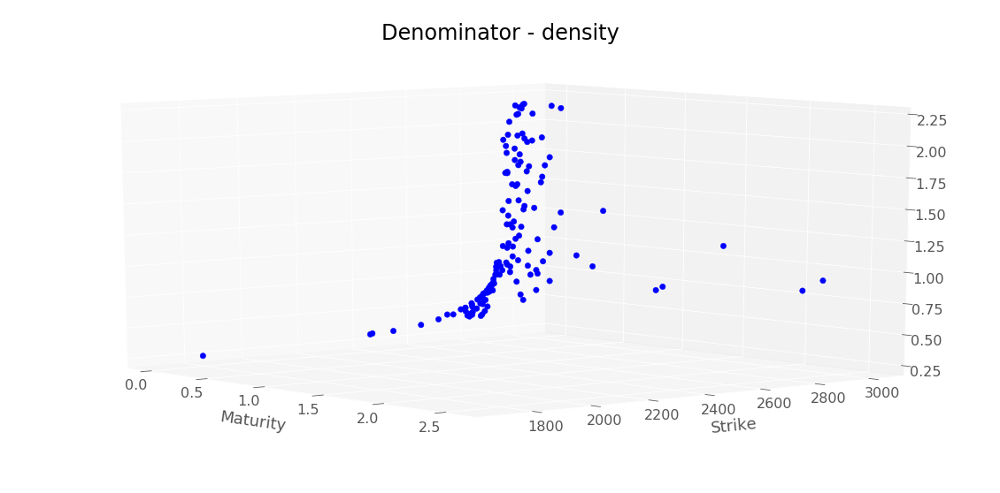

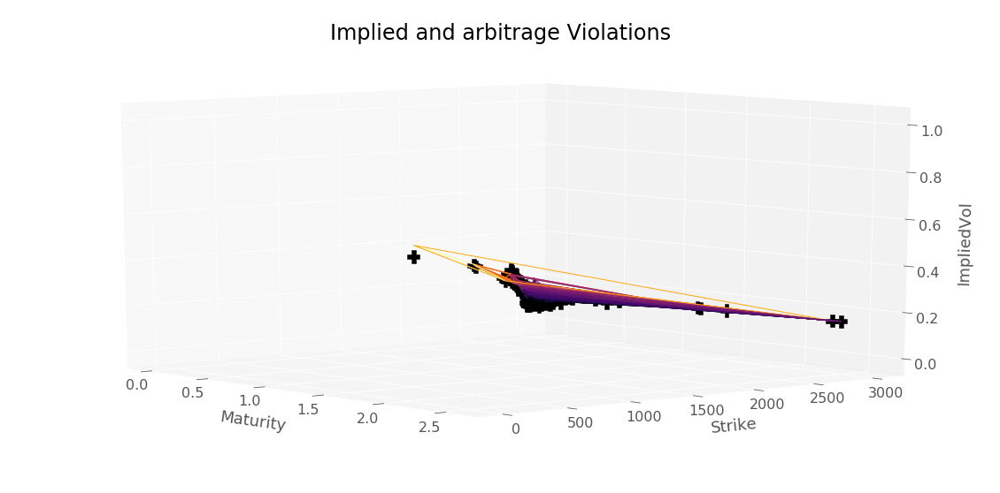

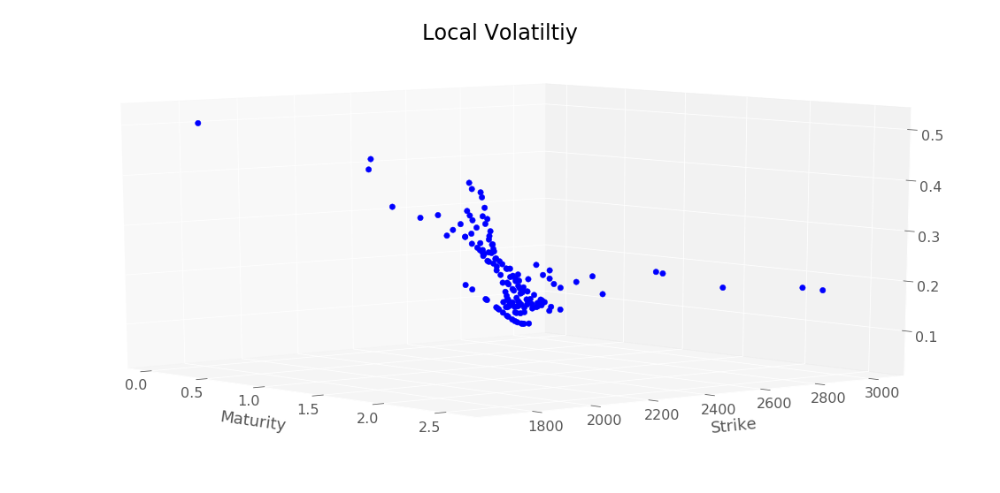

In [70]:
plotTools.diagnoseLocalVol(dT,
                           locVolSSVI,
                           density,
                           interpolationBind(dataSetTest),
                           dataSetTest,
                           az=320,
                           yMin=KMin,
                           yMax=KMax)

# MC backtest 

#### PDE Backtest

Implement Crank-Nicolson scheme for black-scholes PDE in python within *priceEuropeanCallCranckNicholson* function.

It should return the price and the delta.


We want to solve Black-Scholes PDE with log return $x=\log{S}$ that is we want to find $u$ which solves :
$$u(T,x) = \left( e^x - K \right)^+, x \in \mathbb{R}$$
$$\partial_t u + (b - \frac{\sigma^2}{2}) \partial_x u + \frac{1}{2} \sigma^2 \partial_x^2 u  - b u = 0 \textbf{ in }  [0,T) \times (-\infty,\infty)$$

Finite difference methods amounts to bound the domain $\mathcal{O} = [0,T) \times (-\infty,\infty)$ with a bounded one $[0,T) \times (x^-,x^+)$. 
We use dirichlet condition which in the case of european call gives $u(t, x^-) = 0$ and $u(t, x^+) =e^{-b (T-t)} (e^{x^+} - K)$ .

Then we discretize along time axis and space axis and approximate derivatives of $u$ with discrete variations.
Thus we can show for a given time step $h$ and log space step $k$ that we must solve the following linear algebra problem :

$$ \left[ I - h \theta A^k \right] u_{i} = \left[ I - h (1-\theta) A^k \right] u_{i+1} + h \left( \theta w^k(t_i) + (1-\theta) w^k(t_{i+1}) \right)$$
with $u_n^j = \left( e^{\log{S_0} + j k} - K \right)^+ , \forall j \in \mathcal{K}$ a discrete log space discretization.

$A$ is a tridiagonal matrix with $\alpha = \frac{\sigma^2}{2 k^2} - \frac{b}{2k}$ on the lower diagonal, $\gamma = \frac{\sigma^2}{2 k^2} + \frac{b}{2k}$ on the upper diagonal and $\beta = -\left( \frac{\sigma^2}{k^2} + b \right)$ on the main diagonal.
$w_{t_i}$ is a zero vector except the first (upper) element equal $0$ and the last element is equal to $ \gamma e^{-b h (n-i)} (e^{x^+} - K) $.

In the code we note $M^k = \left[ I - h \theta A^k \right]$ and $N^k = \left[ I - h (1-\theta) A^k \right]$.

Cranck Nicholson corresponds to a theta scheme with $\theta=0.5$.
When $\theta=1$ we have the so-call implicit scheme and for $\theta=1$ the explicit scheme.

Cranck-nicholson scheme has the advantage consistent of order two in time and in space.
For $\theta \neq 1/2$ we have only consistency of order one in time and two in space

In constrast with tree, space discretization is the same for each time step.

$$\partial_t u + \left((r_t-q_t) - \frac{\sigma^2 (x,t)}{2} \right) \partial_x u  + \frac{1}{2} \sigma^2 (x,t) \partial_x^2 u  - q_t u = 0 \textbf{ in }  [0,T) \times (-\infty,\infty)$$

CFL condition :
$$ h \leq \frac{k^2}{\sigma_{sup}^2 + b_{sup} k^2}$$

Here we choose $k$ as $$2 * \sqrt{\frac{\sigma_{sup}^2 h}{ 1 - b_{sup} h}} $$

where $\sigma_{sup} = \sup\limits_{(x,t) \in \hat{\Theta}}{\sigma_{loc}(e^x,t)}$ and $b_{sup} = \sup\limits_{t \in [0,T]}{(r-q)(t)}$




In [127]:
nbTimeStep = 100
nbPaths = 100000


In [160]:
importlib.reload(backtest)

<module 'backtest' from './code/backtest.py'>

#### Load GP local volatility

In [215]:
workingFolder = "./data/volLocaleAresky/"
#filename = "local_vol_nx_10_nt_27.xlsx" RMSE :  10.073967351737087
#filename = "local_vol_nx_12_nt_27.xlsx" RMSE :  7.758802111118254
#filename = "local_vol_nx_15_nt_27.xlsx" RMSE :  6.252799135416868
#filename = "local_vol_nx_18_nt_27.xlsx" RMSE :  5.083806059940602
#filename = "local_vol_nx_20_nt_27.xlsx" RMSE :  5.050554384554841
#filename = "local_vol_nx_25_nt_27.xlsx" RMSE :  5.499835852015688
filename = "local_vol_nx_25_nt_27.xlsx"

In [216]:
locVolGP = loadData.loadGPLocVol(workingFolder, filename, bootstrap, S0)

Loading local volatility from :  ./data/volLocaleAresky/local_vol_nx_25_nt_27.xlsx


In [217]:
locVolGP.head()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
1755.208 0.150           -1.0     -0.489871    1752.049794  1755.208   
         0.221           -1.0     -0.489959    1751.895482  1755.208   
         0.292           -1.0     -0.489959    1751.895482  1755.208   
         0.363           -1.0     -0.490425    1751.079875  1755.208   
         0.435           -1.0     -0.490910    1750.229640  1755.208   

                   Maturity            K         T  LocalVolatility  
Strike   Maturity                                                    
1755.208 0.150        0.150  1755.208333  0.150000         1.144739  
         0.221        0.221  1755.208333  0.221154         0.750185  
         0.292        0.292  1755.208333  0.292308         0.604091  
         0.363        0.363  1755.208333  0.363462         0.723489  
         0.435        0.435  1755.208333  0.434615         0.748934

#### GP Local Volatility

In [218]:
nnGP = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolGP["LocalVolatility"], x, y)

In [219]:
strikeLow = min(dataSet["Strike"].min(),dataSetTest["Strike"].min()) #dataSet["Strike"].min()
strikeUp = max(dataSet["Strike"].max(),dataSetTest["Strike"].max()) #dataSet["Strike"].max()
strikeGrid = np.linspace(strikeLow, strikeUp, 100)
matLow = min(dataSet["Maturity"].min(),dataSetTest["Maturity"].min()) #dataSet["Maturity"].min()
matUp = max(dataSet["Maturity"].max(),dataSetTest["Maturity"].max()) #dataSetTest["Maturity"].max()
matGrid = np.linspace(matLow, matUp, 100)
volLocaleGrid = np.meshgrid(strikeGrid, matGrid)
volLocaleGridDf = pd.DataFrame(np.vstack((np.ravel(volLocaleGrid[0]), np.ravel(volLocaleGrid[1]))).T, 
                               columns = ["Strike", "Maturity"]).set_index(["Strike","Maturity"],drop=False)
volLocaleGridDf["ChangedStrike"] = bootstrap.changeOfVariable(volLocaleGridDf["Strike"], volLocaleGridDf["Maturity"])[0]
volLocaleGridDf["logMoneyness"] = np.log(volLocaleGridDf["ChangedStrike"] / S0)
volLocaleGridDf["OptionType"] = np.ones_like(volLocaleGridDf["logMoneyness"])

In [220]:
volLocaleGridDf.head()

,,Strike,Maturity,ChangedStrike,logMoneyness,OptionType
Strike,Maturity,,,,,
1700.000000,0.005,1700.000000,0.005,1698.937070,-0.520654,1.0
1725.252525,0.005,1725.252525,0.005,1724.173806,-0.505909,1.0
1750.505051,0.005,1750.505051,0.005,1749.410542,-0.491378,1.0
1775.757576,0.005,1775.757576,0.005,1774.647278,-0.477056,1.0
1801.010101,0.005,1801.010101,0.005,1799.884015,-0.462935,1.0


In [221]:
mcResGPTest = backtest.MonteCarloPricerVectorized(S0,
                                                  dataSetTest,
                                                  bootstrap,
                                                  nbPaths,
                                                  nbTimeStep,
                                                  nnGP)
mcResGPTest.head()

Price    stdPrice
Strike Maturity                       
1700.0 0.246      1.004985   21.142314
2300.0 0.419     17.163143  102.783229
2350.0 0.093      0.524269   13.004815
       0.112      1.137215   20.536079
2400.0 0.419     25.662781  121.983945

In [222]:
mcResGPTest.to_csv(workingFolder + "mcResGPTest.csv")

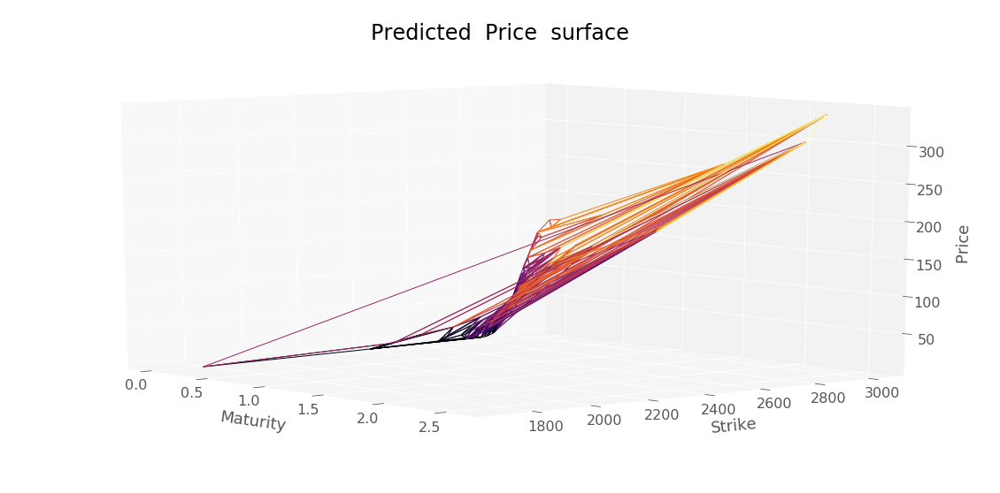

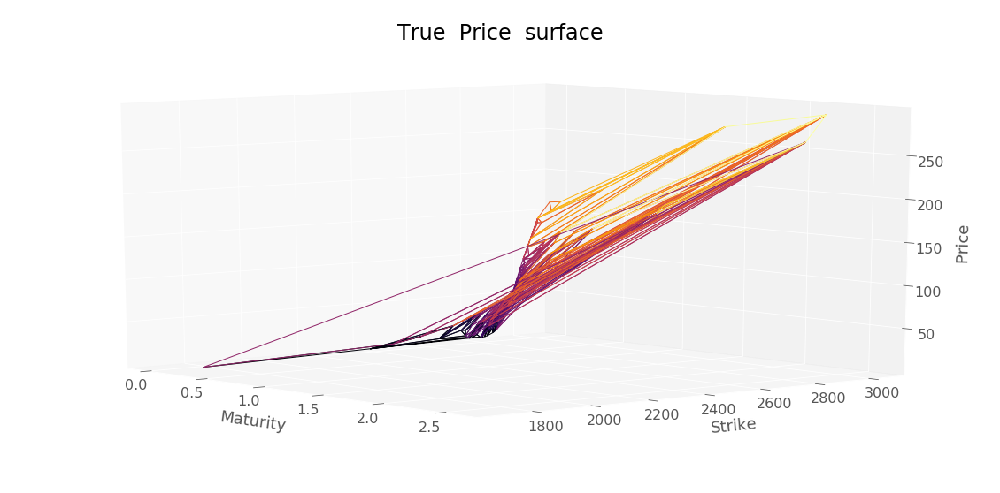

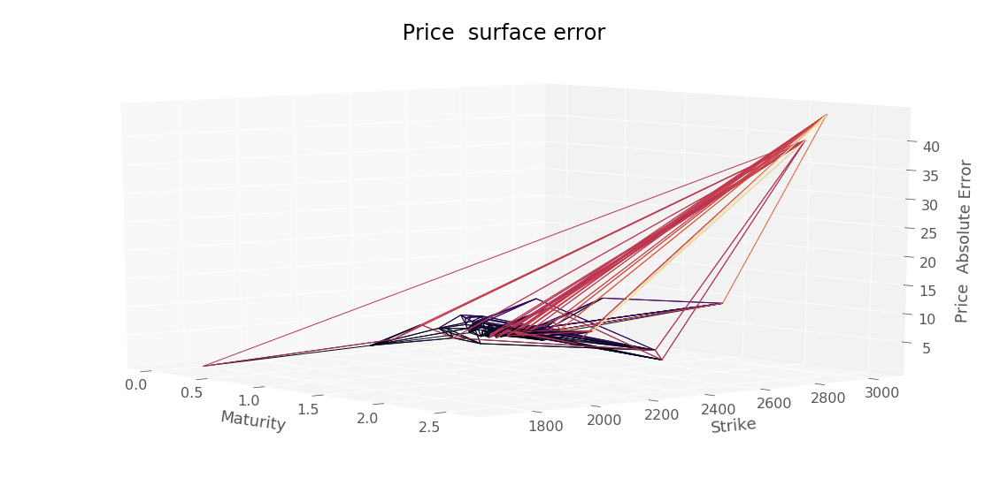

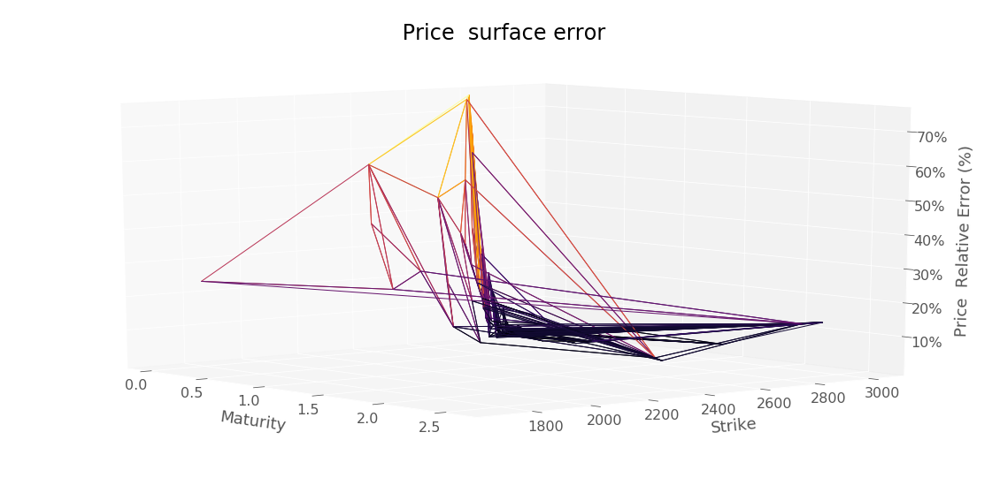

RMSE :  5.499835852015688


In [223]:
plotTools.predictionDiagnosis(mcResGPTest["Price"], 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

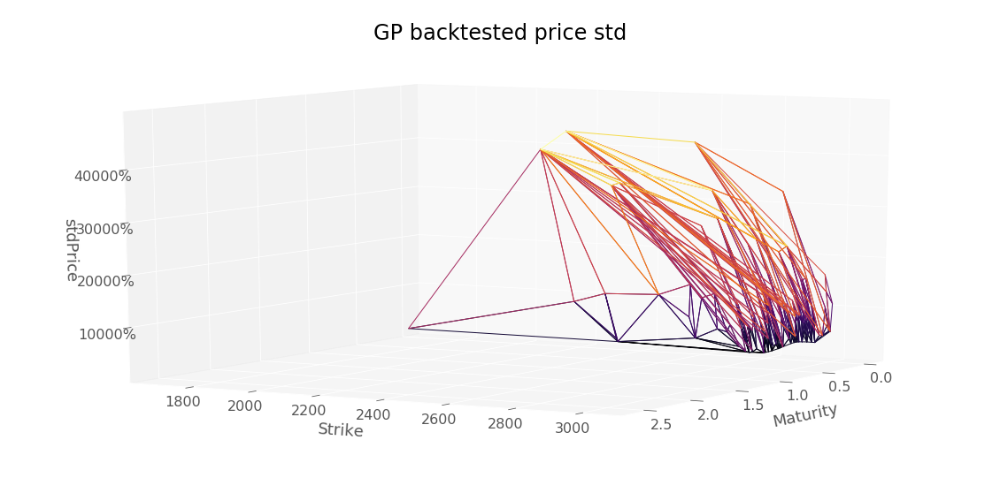

In [224]:
plotTools.plotSerie(mcResGPTest["stdPrice"],
                    Title = 'GP backtested price std',
                    az=30,
                    yMin=KMin,
                    yMax=KMax, 
                    zAsPercent=True)

In [225]:
testingDataSetGP = dataSetConstruction.interpolatedLocalVolatility(locVolGP, 
                                                                   dataSetTest["Price"])

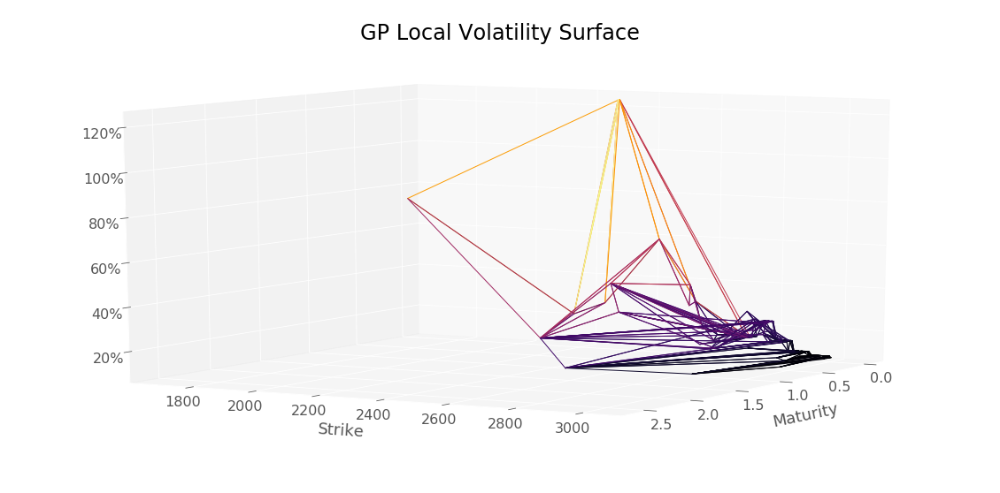

In [226]:
plotTools.plotSerie(testingDataSetGP,
                    Title = 'GP Local Volatility Surface',
                    az=30,
                    yMin=KMin,
                    yMax=KMax, 
                    zAsPercent=True)

In [114]:
pdeResSigmaGPTest = backtest.PDEPricerVectorized(dataSetTest, S0, nnGP, bootstrap)
pdeResSigmaGPTest.head()

Strike  Maturity
3600    0.118        0.024807
        0.367        5.285168
        0.597       18.263646
        0.866       33.739158
3800    0.118        0.092928
dtype: float64

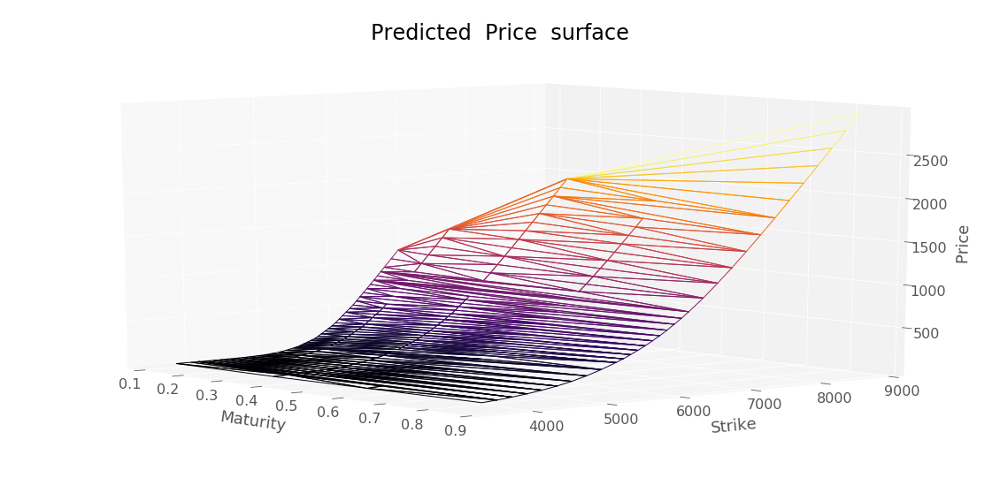

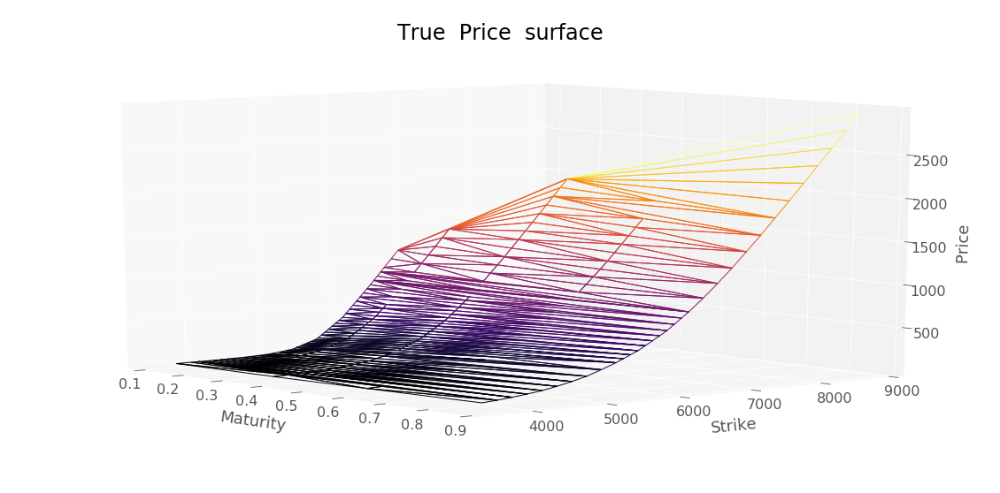

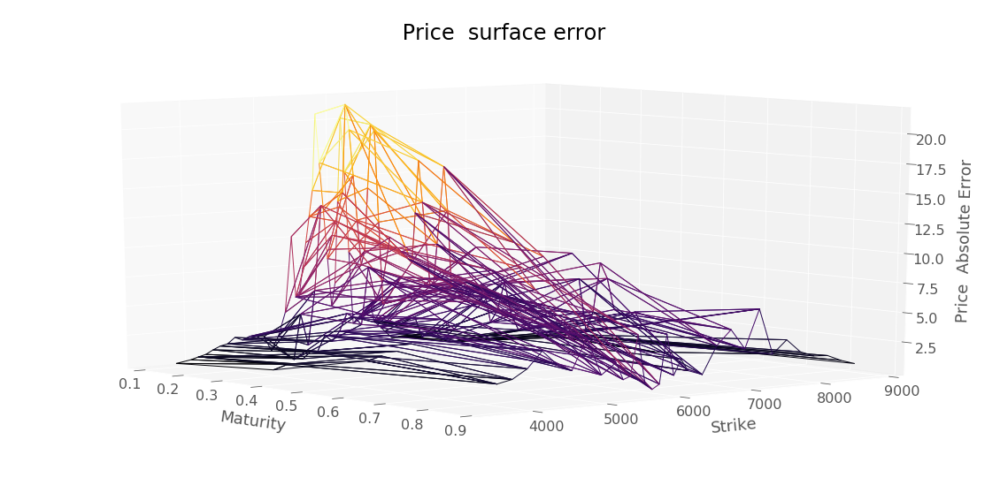

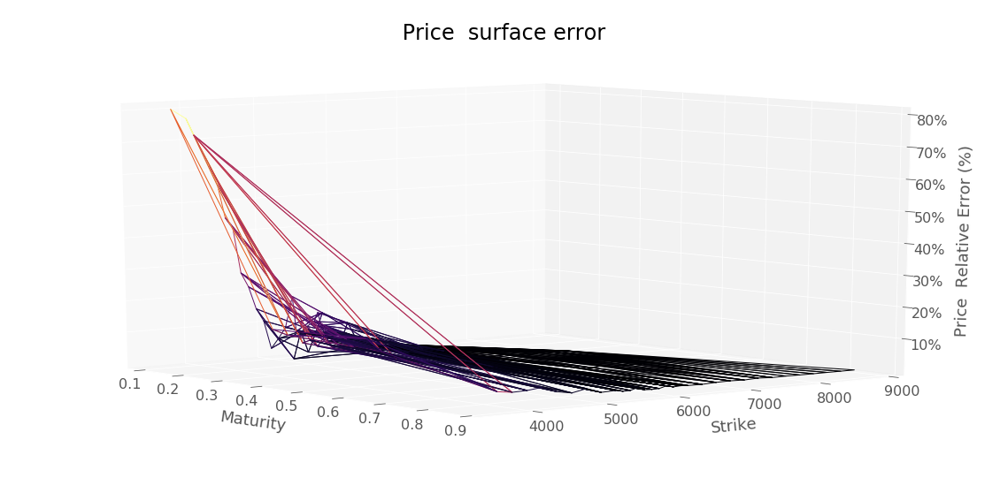

RMSE :  7.527944334447842


In [115]:
plotTools.predictionDiagnosis(pdeResSigmaGPTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [116]:
pdeResSigmaGPTest.to_csv(workingFolder + "pdeResSigmaGPTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


#### Tikhonov calibration

In [122]:
nnVolLocaleTykhonov = lambda x,y : backtest.interpolatedMCLocalVolatility(localVolatility["LocalVolatility"], x, y)


In [123]:
s = testingDataSetAresky.index.get_level_values("Strike").values
t = testingDataSetAresky.index.get_level_values("Maturity").values

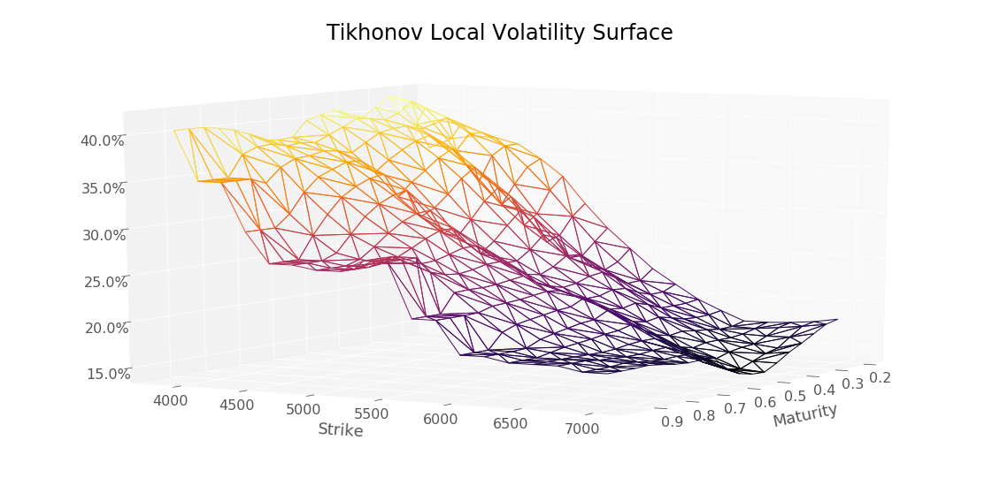

In [124]:
tikhonovLocVol = nnVolLocaleTykhonov(s, t)
plotTools.plotSerie(tikhonovLocVol[tikhonovLocVol.index.get_level_values("Maturity") > 0.01],
                    Title = 'Tikhonov Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [125]:
mcResTikhonovTest = backtest.MonteCarloPricerVectorized(S0,
                                                        dataSetTest,
                                                        bootstrap,
                                                        nbPaths,
                                                        nbTimeStep,
                                                        nnVolLocaleTykhonov)
mcResTikhonovTest.head()

Strike  Maturity
3858.6  0.200        0.568095
        0.242        8.990208
        0.284       10.218066
        0.326        9.116409
        0.368       15.431192
dtype: float64

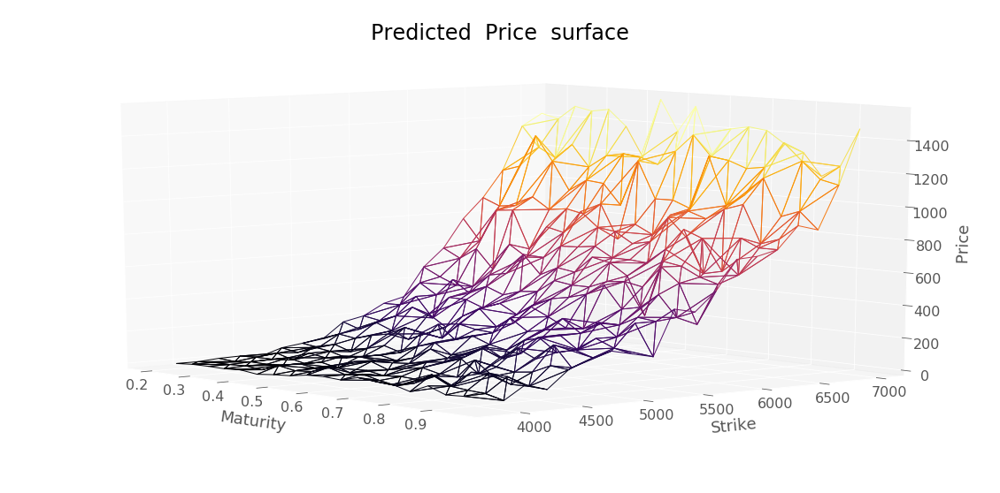

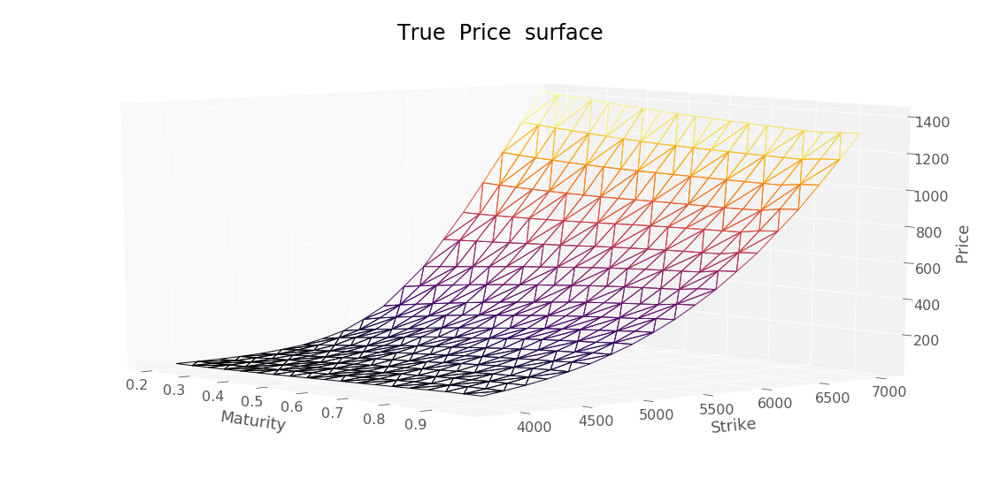

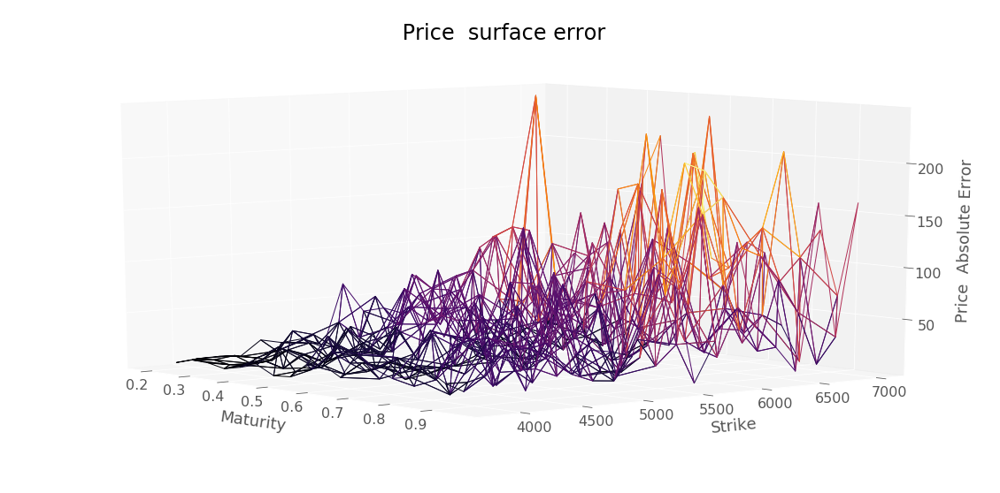

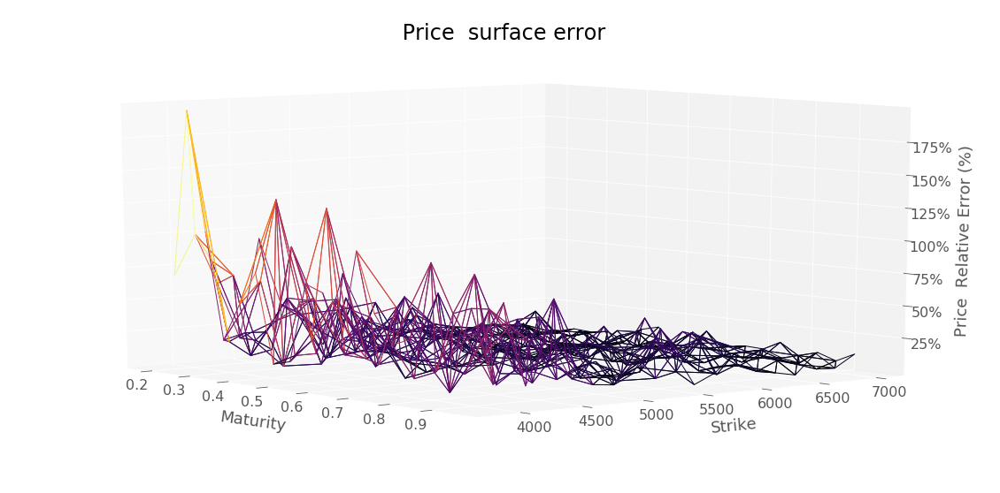

RMSE :  65.35494311648065


In [126]:
plotTools.predictionDiagnosis(mcResTikhonovTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [127]:
mcResTikhonovTest.to_csv(workingFolder + "mcResTikhonovTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [128]:
mcResTikhonovTrain = backtest.MonteCarloPricerVectorized(S0,
                                                         dataSet,
                                                         bootstrap,
                                                         nbPaths,
                                                         nbTimeStep,
                                                         nnVolLocaleTykhonov)
mcResTikhonovTrain.head()

Strike  Maturity
3600    0.118        0.000000
        0.367        0.000000
        0.597       21.634106
        0.866       44.849111
3800    0.118        0.000000
dtype: float64

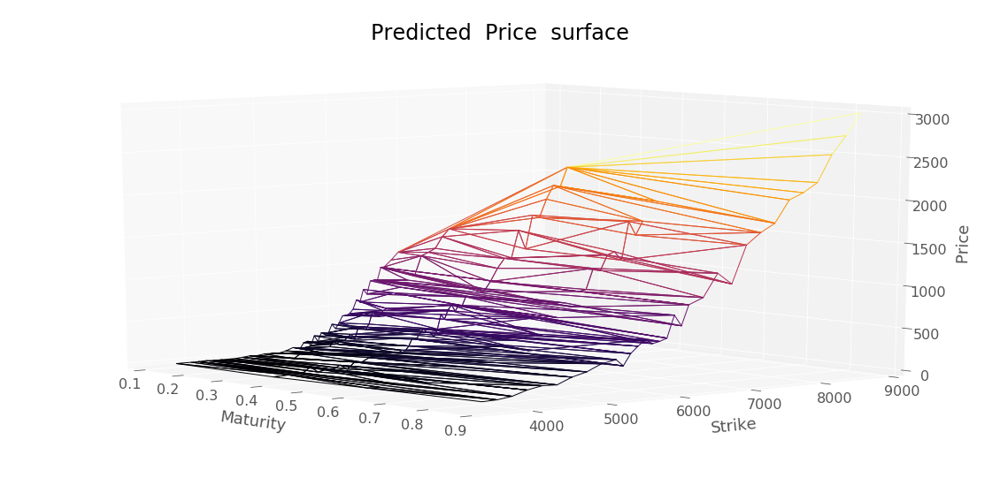

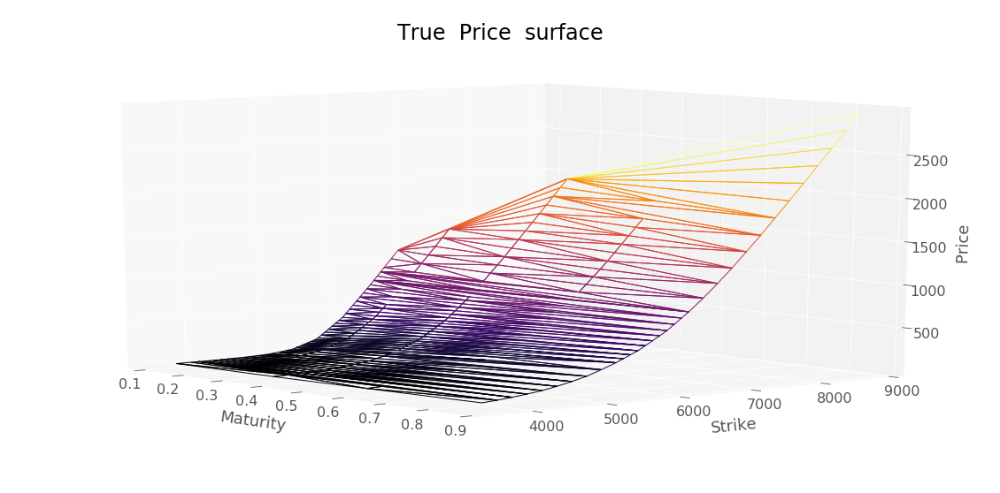

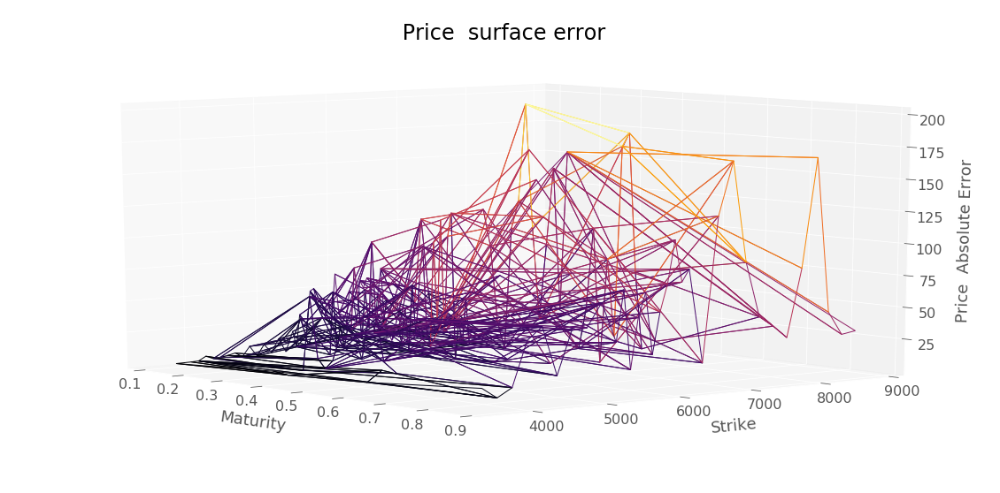

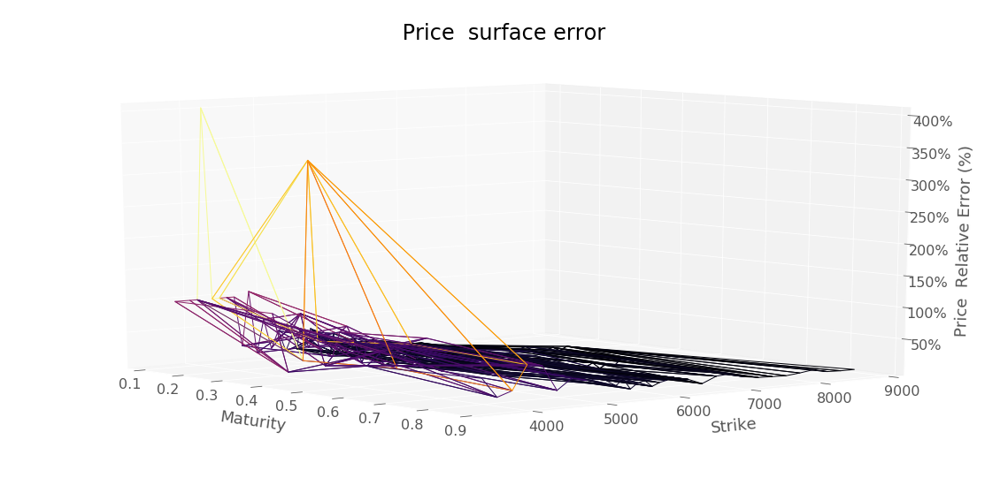

RMSE :  60.993962608159954


In [129]:
plotTools.predictionDiagnosis(mcResTikhonovTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [130]:
mcResTikhonovTrain.to_csv(workingFolder + "mcResTikhonovTrain.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [131]:
pdeResSigmaTikhonovTrain = backtest.PDEPricerVectorized(dataSet, S0, nnVolLocaleTykhonov, bootstrap)
pdeResSigmaTikhonovTrain.head()

KeyboardInterrupt: 

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaTikhonovTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaTikhonovTrain.to_csv(workingFolder + "pdeResSigmaTikhonovTrain.csv")

In [ ]:
pdeResSigmaTikhonovTest = backtest.PDEPricerVectorized(dataSetTest, S0, nnVolLocaleTykhonov, bootstrap)
pdeResSigmaTikhonovTest.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaTikhonovTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaTikhonovTest.to_csv(workingFolder + "pdeResSigmaTikhonovTest.csv")

#### Backtest Local volatility SSVI 

In [71]:
nbTimeStep = 100
nbPaths = 100000

In [72]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(dataSetTest, interpolationBind)
nnSSVI = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolSSVI, x, y)

In [83]:
strikeLow = min(dataSet["Strike"].min(),dataSetTest["Strike"].min()) #dataSet["Strike"].min()
strikeUp = max(dataSet["Strike"].max(),dataSetTest["Strike"].max()) #dataSet["Strike"].max()
strikeGrid = np.linspace(strikeLow, strikeUp, 100)
matLow = min(dataSet["Maturity"].min(),dataSetTest["Maturity"].min()) #dataSet["Maturity"].min()
matUp = max(dataSet["Maturity"].max(),dataSetTest["Maturity"].max()) #dataSetTest["Maturity"].max()
matGrid = np.linspace(matLow, matUp, 100)
volLocaleGrid = np.meshgrid(strikeGrid, matGrid)
volLocaleGridDf = pd.DataFrame(np.vstack((np.ravel(volLocaleGrid[0]), np.ravel(volLocaleGrid[1]))).T, 
                               columns = ["Strike", "Maturity"]).set_index(["Strike","Maturity"],drop=False)
volLocaleGridDf["ChangedStrike"] = bootstrap.changeOfVariable(volLocaleGridDf["Strike"], volLocaleGridDf["Maturity"])[0]
volLocaleGridDf["logMoneyness"] = np.log(volLocaleGridDf["ChangedStrike"] / S0)
volLocaleGridDf["OptionType"] = np.ones_like(volLocaleGridDf["logMoneyness"])

In [84]:
volLocaleGridDf.head()

,,Strike,Maturity,ChangedStrike,logMoneyness,OptionType
Strike,Maturity,,,,,
1700.000000,0.005,1700.000000,0.005,1698.937070,-0.520654,1.0
1725.252525,0.005,1725.252525,0.005,1724.173806,-0.505909,1.0
1750.505051,0.005,1750.505051,0.005,1749.410542,-0.491378,1.0
1775.757576,0.005,1775.757576,0.005,1774.647278,-0.477056,1.0
1801.010101,0.005,1801.010101,0.005,1799.884015,-0.462935,1.0


In [98]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT2, hk2, dK2, locVolSSVI2, density2 = SSVI.finiteDifferenceSVI(volLocaleGridDf, interpolationBind)
cleanValue = ~(dT2.isna() | density2.isna() | (dT2 < 0) | (density2 < 0) )
dT2 = dT2[cleanValue.values]
density2 = density2[cleanValue.values]
hk2 = hk2[cleanValue.values]
locVolSSVI2 = locVolSSVI2[cleanValue.values]
dK2 = dK2[cleanValue.values]

nnSSVI2 = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolSSVI2, x, y)

In [73]:
mcResSSVITest = backtest.MonteCarloPricerVectorized(S0,
                                                    dataSetTest,
                                                    bootstrap,
                                                    nbPaths,
                                                    nbTimeStep,
                                                    nnSSVI)
mcResSSVITest.head()

Strike  Maturity
1700.0  0.246        0.135185
2300.0  0.419       13.705793
2350.0  0.093        0.569895
        0.112        0.885200
2400.0  0.419       19.473015
dtype: float64

In [74]:
mcResSSVITest.to_csv(workingFolder + "mcResSSVITest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


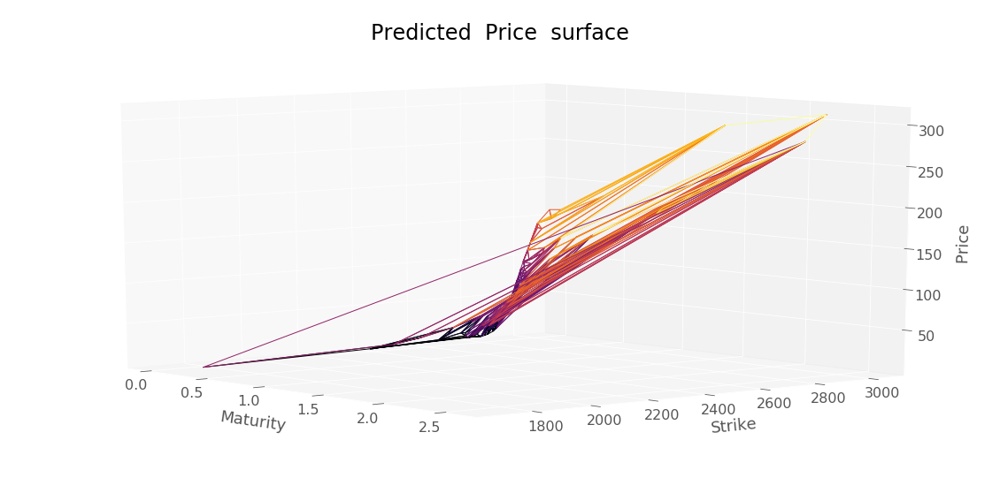

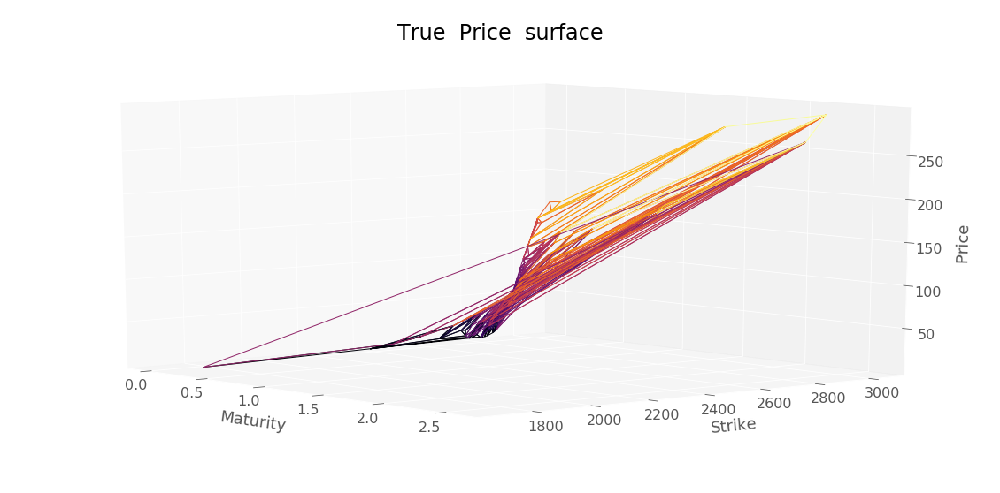

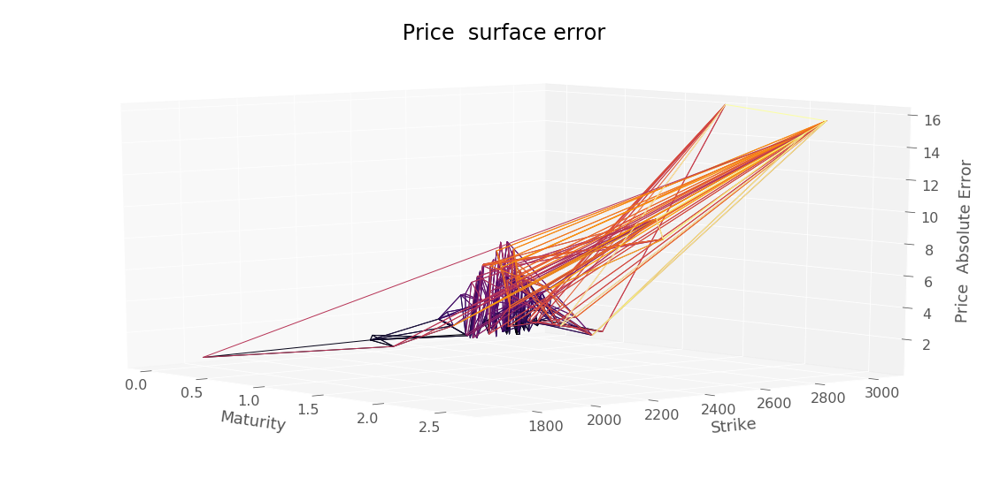

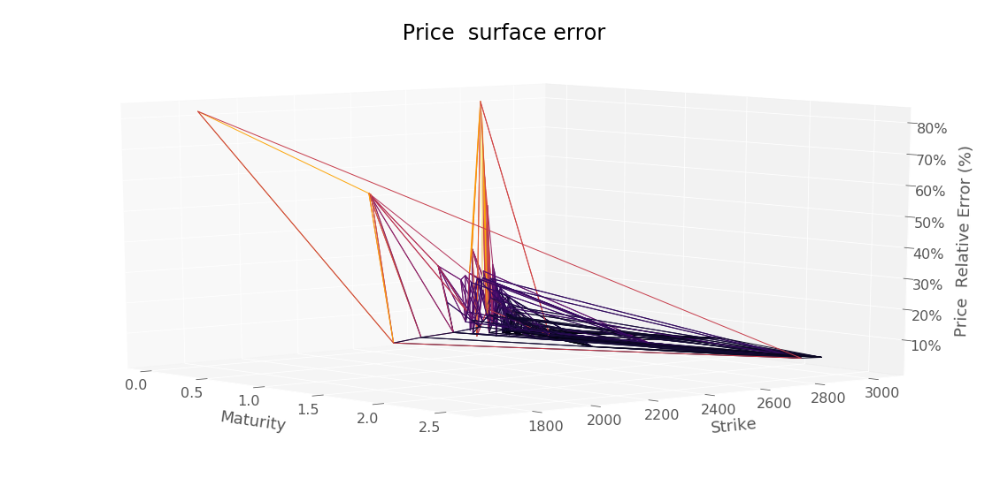

RMSE :  3.6257511903744417


In [75]:
plotTools.predictionDiagnosis(mcResSSVITest["Price"], 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [99]:
mcResSSVITest2 = backtest.MonteCarloPricerVectorized(S0,
                                                     dataSetTest,
                                                     bootstrap,
                                                     nbPaths,
                                                     nbTimeStep,
                                                     nnSSVI2)
mcResSSVITest2.head()

Strike  Maturity
1700.0  0.246        1.282704
2300.0  0.419       26.052731
2350.0  0.093       14.647015
        0.112       15.266773
2400.0  0.419       38.438380
dtype: float64

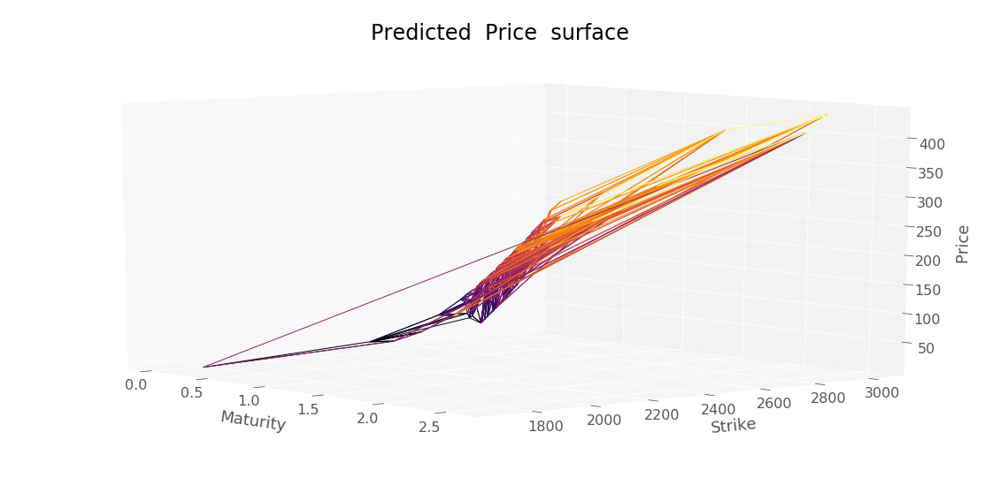

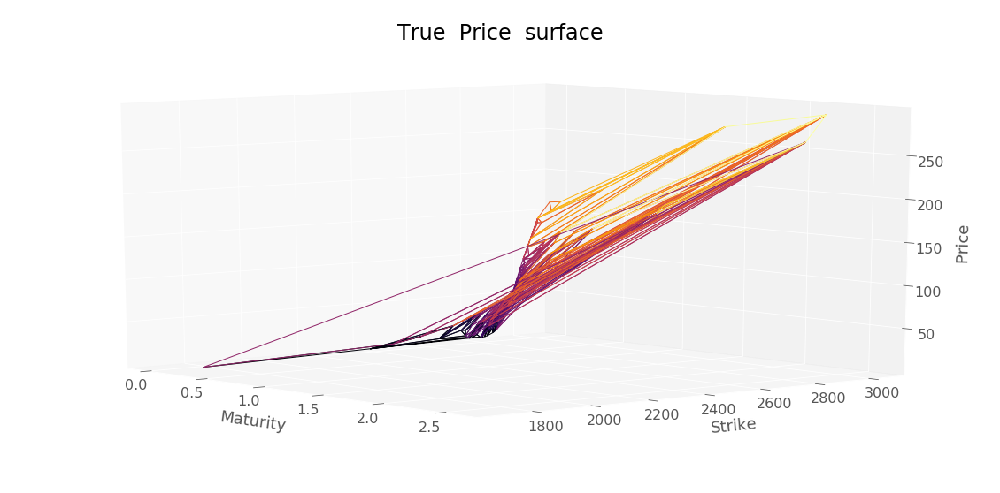

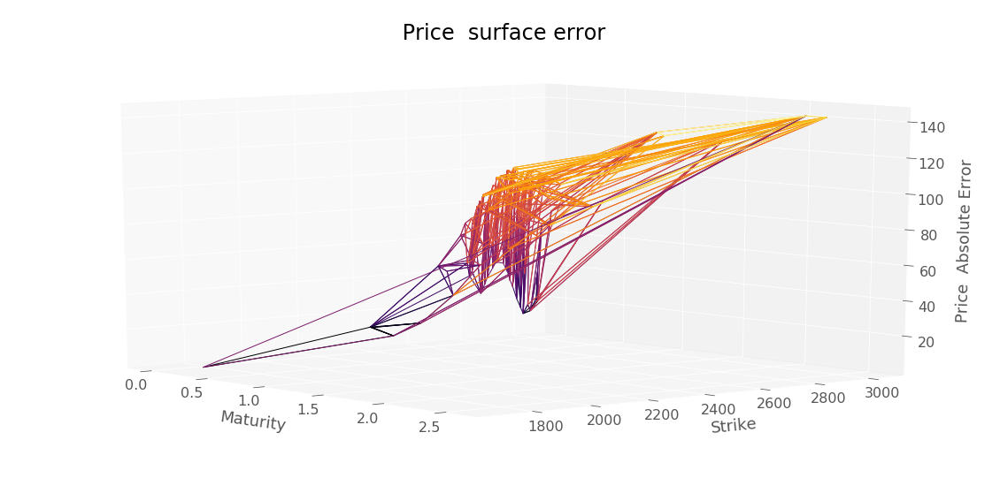

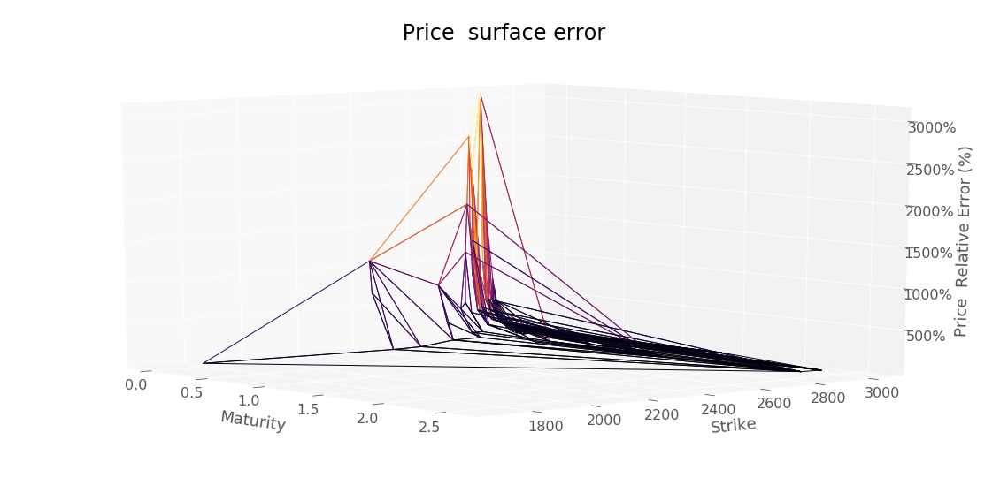

RMSE :  73.11045395481749


In [100]:
plotTools.predictionDiagnosis(mcResSSVITest2["Price"], 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [101]:
mcResSSVITest2.to_csv(workingFolder + "mcResSSVITest2.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [ ]:
plotTools.plotSerie(testingDataSetSSVI[testingDataSetSSVI.index.get_level_values("Maturity") > 0.01],
                    Title = 'SSVI Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [ ]:
pdeResSigmaSSVITest = backtest.PDEPricerVectorized(dataSetTest, S0, nnSSVI, bootstrap)
pdeResSigmaSSVITest.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaSSVITest.to_csv(workingFolder + "pdeResSigmaSSVITest.csv")

In [ ]:
pdeResSigmaSSVITest2 = backtest.PDEPricerVectorized(dataSetTest, S0, nnSSVI2, bootstrap)
pdeResSigmaSSVITest2.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITest2, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaSSVITest2.to_csv(workingFolder + "pdeResSigmaSSVITest2.csv")

#### Compute errors

In [ ]:
PriceconvexSoftGatheralVolModelTrain = backtest.loadMCPrices("PriceconvexSoftGatheralVolModelTrain.csv", 
                                                             parseHeader=0)
PriceconvexSoftGatheralVolModelTrain.head()

In [ ]:
mcResSSVITrain = backtest.loadMCPrices("mcResSSVITrain.csv")
mcResSSVITrain.head()

In [ ]:
backtest.rmse(mcResSSVITrain[2], dataSet["Price"])

In [ ]:
mcResTikhonovTrain = backtest.loadMCPrices("mcResTikhonovTrain.csv")
mcResTikhonovTrain.head()

In [ ]:
backtest.rmse(mcResTikhonovTrain[2], dataSet["Price"])

In [ ]:
mcResSigmaAreskyTrain = backtest.loadMCPrices("mcResSigmaAreskyTrain.csv")
mcResSigmaAreskyTrain.head()

In [ ]:
backtest.rmse(mcResSigmaAreskyTrain[2], dataSet["Price"])

In [ ]:
#Grid 100 points
mcResVolLocale7Train = backtest.loadMCPrices("mcResVolLocale7Train.csv",parseHeader=0)
mcResVolLocale7Train.head()

In [ ]:
backtest.rmse(mcResVolLocale7Train["0"], dataSet["Price"])

In [ ]:
backtest.rmse(mcResVolLocale7Train["0"], PriceconvexSoftGatheralVolModelTrain["Price"])

In [ ]:
#Grid test
mcResVolLocale8Train = backtest.loadMCPrices("mcResVolLocale8Train.csv",parseHeader=0)
mcResVolLocale8Train.head()

In [ ]:
backtest.rmse(mcResVolLocale8Train["0"], dataSet["Price"])

In [ ]:
backtest.rmse(mcResVolLocale8Train["0"], PriceconvexSoftGatheralVolModelTrain["Price"])

In [ ]:
PriceconvexSoftGatheralVolModelTest = backtest.loadMCPrices("PriceconvexSoftGatheralVolModelTest.csv", 
                                                            parseHeader=0)
PriceconvexSoftGatheralVolModelTest.head()

In [ ]:
mcResSSVITest = backtest.loadMCPrices("mcResSSVITest.csv")
mcResSSVITest.head()

In [ ]:
backtest.rmse(mcResSSVITest[2], dataSetTest["Price"])

In [ ]:
mcResTikhonovTest = backtest.loadMCPrices("mcResTikhonovTest.csv")
mcResTikhonovTest.head()

In [ ]:
backtest.rmse(mcResTikhonovTest[2], dataSetTest["Price"])

In [ ]:
mcResSigmaAreskyTest = backtest.loadMCPrices("mcResSigmaAreskyTest.csv")
mcResSigmaAreskyTest.head()

In [ ]:
backtest.rmse(mcResSigmaAreskyTest[2], dataSetTest["Price"])

In [ ]:
#Grid 100 points
mcResVolLocale7Test = backtest.loadMCPrices("mcResVolLocale7Test.csv",parseHeader=0)
mcResVolLocale7Test.head()

In [ ]:
backtest.rmse(mcResVolLocale7Test["0"], dataSetTest["Price"])

In [ ]:
backtest.rmse(mcResVolLocale7Test["0"], PriceconvexSoftGatheralVolModelTest["Price"])

In [ ]:
#Grid test
mcResVolLocale8Test = backtest.loadMCPrices("mcResVolLocale8Test.csv",parseHeader=0)
mcResVolLocale8Test.head()

In [ ]:
backtest.rmse(mcResVolLocale8Test["0"], dataSetTest["Price"])

In [ ]:
backtest.rmse(mcResVolLocale8Test["0"], PriceconvexSoftGatheralVolModelTest["Price"])